# Preparing "BGP Clear" events for modeling. Includes shifted anomaly for prediction.
https://github.com/cisco-ie/telemetry

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pytz
%matplotlib inline

In [240]:
def visualize(x, y_true, columns=None):
    n_rows=np.round(len(columns)/5).astype(int)
    f, ax=plt.subplots(n_rows, 5, figsize=(18, 3*n_rows), sharex=True)
    for i in range(len(columns)):
        x_ind=int(i/5)
        y_ind=int(i%5)
        ax[x_ind][y_ind].plot(x[:, i], alpha=0.8)
        if x[:, i].std()>0:
            vlines_min=np.nanmin(x[:, i])
            vlines_max=np.nanmax(x[:, i])
        elif np.nanmin(x[:, i])==0 and np.nanmax(x[:, i])==0:
            vlines_min=-0.5
            vlines_max=0.5
        else:
            vlines_min=0.8*np.nanmin(x[:, i])
            vlines_max=1.2*np.nanmax(x[:, i])
        #ax[x_ind][y_ind].vlines(np.nonzero(y_pred>0.5)[0], vlines_min, vlines_max, alpha=0.5)
        down=np.nonzero(y_true)[0]
#         print(down, vlines_min, vlines_max)
        if down.shape[0] < 5 and down.shape[0] > 0: 
            ax[x_ind][y_ind].vlines([down[0], down[-1]], vlines_min, vlines_max, colors = 'yellow', alpha=0.3, linewidth=5)   
        elif down.shape[0] >= 5:
            ax[x_ind][y_ind].fill_between([down[0], down[-1]], vlines_min, vlines_max, facecolor='red', alpha=0.4,)   
        ax[x_ind][y_ind].set_title('Feature %s' % (i+1))
    return f, ax

In [3]:
def visualize_prediction_clustermap(df, columns=None, **kw):
    df_tmp=df.copy()
    row_colors_cols = ['Anomaly']
    if 'Pred' in df_tmp.columns:
        row_colors_cols.append('Pred')
    df_tmp[row_colors_cols]=df_tmp[row_colors_cols].replace(to_replace={True: 'r', False: 'b'})
    g=sns.clustermap(df_tmp[columns], row_colors=df_tmp[row_colors_cols],
                     figsize=(16,6), vmin=-8, vmax=8, **kw)
    return g

In [4]:
# 11 events in 1 hour
df_2=pd.read_csv('../Data/cisco_telemetry/2/bgpclear_cleaned.csv', low_memory = False).dropna(axis=1, how='all')
df_2['time'] = pd.to_datetime(df_2['time'].astype('int'), unit='ns')

In [5]:
# 8 events in 0.55 hour
df_3=pd.read_csv('../Data/cisco_telemetry/3/bgpclear08042017.csv', low_memory = False).dropna(axis=1, how='all')
df_3['time'] = pd.to_datetime(df_3['time'].astype('int'), unit='ns')

In [6]:
# 12 events in 2 hours
df_5=pd.read_csv('../Data/cisco_telemetry/5/bgpclear_apptraffic_2hourRun.csv', low_memory = False).dropna(axis=1, how='all')
df_5['time'] = pd.to_datetime(df_5['time'].astype('int'), unit='ns')

In [7]:
# 12 events in 2 hours
df_6=pd.read_csv('../Data/cisco_telemetry/6/bgpclear_no_traffic_2hourRun.csv', low_memory = False).dropna(axis=1, how='all')
df_6['time'] = pd.to_datetime(df_6['time'].astype('int'), unit='ns')

In [8]:
df_2_gt=pd.read_csv('../Data/cisco_telemetry/2/bgpclear_ground_truth.txt')
for i in ['Start', 'End']:
    df_2_gt[i] = pd.to_datetime(df_2_gt[i].astype('int'), unit='s')

In [9]:
def dateparser(x):
    if isinstance(x, str):
        # need to convert PDT timezone to unix timezone (UTC) so it would match with times in df_3
        return pytz.timezone('US/Pacific').localize(pd.datetime.strptime(x, "%m/%d/%y %H:%M")).astimezone(pytz.utc)
    else:
        return pd.NaT
df_3_gt=pd.read_csv('../Data/cisco_telemetry/3/bgpclear_casedata.csv', parse_dates=[2, 3, 4, 5], date_parser=dateparser)

In [10]:
df_5_gt=pd.read_json('../Data/cisco_telemetry/5/bgpclear_apptraffic_event.log')

In [11]:
df_6_gt=pd.read_json('../Data/cisco_telemetry/6/bgpclear_no_traffic_event.log')

In [12]:
df_2.shape, df_3.shape, df_5.shape, df_6.shape

((743437, 87), (515022, 87), (2842380, 87), (2845058, 87))

In [13]:
for d in [df_2, df_3, df_5, df_6]:
    print('Timespan: %s to %s (%s)' % (d.time.min(), d.time.max(), d.time.max()-d.time.min()))

Timespan: 2017-06-29 16:34:32.913000 to 2017-06-29 17:24:32.817000 (0 days 00:49:59.904000)
Timespan: 2017-08-04 17:16:47.540000 to 2017-08-04 17:47:55.250000 (0 days 00:31:07.710000)
Timespan: 2018-02-20 01:18:32.391000 to 2018-02-20 03:33:37.058000 (0 days 02:15:04.667000)
Timespan: 2018-02-19 19:34:11.006000 to 2018-02-19 21:49:10.797000 (0 days 02:14:59.791000)


In [14]:
df_2_gt.head()

,Node,Host,Start,End,Event,Type
0,leaf1,None,2017-06-29 16:40:14,2017-06-29 16:43:17,clearBGP,single
1,spine4,None,2017-06-29 16:44:14,2017-06-29 16:47:23,clearBGP,single
2,leaf8,None,2017-06-29 16:48:03,2017-06-29 16:51:13,clearBGP,single
3,spine2,None,2017-06-29 16:52:02,2017-06-29 16:55:04,clearBGP,single
4,leaf2,None,2017-06-29 16:57:02,2017-06-29 17:00:35,clearBGP,single


In [15]:
df_3_gt.head()

,Port Flap,Sample Frequency,Telemetry Start (PDT),Event Start (PDT),Event End (PDT),Telemetry End (PDT),Event Device,Comments,File Name
0,Clean Base Line,4 seconds,2017-08-04 17:15:00+00:00,NaT,NaT,2017-08-04 17:48:00+00:00,NaN,NaN,bgpclear08042017.csv
1,BGP Clear start,NaN,NaT,2017-08-04 17:20:00+00:00,2017-08-04 17:22:00+00:00,NaT,leaf1,NaN,NaN
2,BGP Clear start,NaN,NaT,2017-08-04 17:25:00+00:00,2017-08-04 17:27:00+00:00,NaT,leaf6,NaN,NaN
3,BGP Clear start,NaN,NaT,2017-08-04 17:30:00+00:00,2017-08-04 17:32:00+00:00,NaT,spine2,NaN,NaN
4,BGP Clear start,NaN,NaT,2017-08-04 17:35:00+00:00,2017-08-04 17:38:00+00:00,NaT,leaf2,30 sec between failures,NaN


In [16]:
df_5_gt

,end_time,event_key,host_key,start_time
0,2018-02-20 01:31:41.447,clear_bgp,leaf3,2018-02-20 01:31:33.609
1,2018-02-20 01:41:49.227,clear_bgp,spine4,2018-02-20 01:41:41.547
2,2018-02-20 01:51:56.577,clear_bgp,leaf4,2018-02-20 01:51:49.325
3,2018-02-20 02:02:04.139,clear_bgp,leaf8,2018-02-20 02:01:56.677
4,2018-02-20 02:12:11.714,clear_bgp,leaf5,2018-02-20 02:12:04.240
5,2018-02-20 02:22:19.340,clear_bgp,spine2,2018-02-20 02:22:11.801
6,2018-02-20 02:32:26.391,clear_bgp,leaf7,2018-02-20 02:32:19.437
7,2018-02-20 02:42:33.561,clear_bgp,leaf1,2018-02-20 02:42:26.406
8,2018-02-20 02:52:40.971,clear_bgp,leaf6,2018-02-20 02:52:33.640
9,2018-02-20 03:02:48.545,clear_bgp,spine1,2018-02-20 03:02:41.037


In [17]:
df_6_gt.head()

,end_time,event_key,host_key,start_time
0,2018-02-19 19:45:17.074,clear_bgp,spine3,2018-02-19 19:45:09.191
1,2018-02-19 19:55:24.453,clear_bgp,leaf2,2018-02-19 19:55:17.102
2,2018-02-19 20:05:31.708,clear_bgp,leaf8,2018-02-19 20:05:24.554
3,2018-02-19 20:15:39.185,clear_bgp,leaf6,2018-02-19 20:15:31.805
4,2018-02-19 20:25:46.426,clear_bgp,leaf5,2018-02-19 20:25:39.285


In [18]:
df_2_gt.rename(columns={'Node': 'Producer', 'Start': 'start_time', 'End': 'end_time'}, inplace=True)
df_3_gt.rename(columns={'Event Start (PDT)': 'start_time', 'Event End (PDT)': 'end_time', 'Event Device': 'Producer'}, 
               inplace=True)
df_3_gt.drop([0], inplace=True)
df_5_gt.rename(columns={'host_key': 'Producer'}, inplace=True)
df_6_gt.rename(columns={'host_key': 'Producer'}, inplace=True)

In [19]:
df_3_gt

,Port Flap,Sample Frequency,Telemetry Start (PDT),start_time,end_time,Telemetry End (PDT),Producer,Comments,File Name
1,BGP Clear start,NaN,NaT,2017-08-04 17:20:00+00:00,2017-08-04 17:22:00+00:00,NaT,leaf1,NaN,NaN
2,BGP Clear start,NaN,NaT,2017-08-04 17:25:00+00:00,2017-08-04 17:27:00+00:00,NaT,leaf6,NaN,NaN
3,BGP Clear start,NaN,NaT,2017-08-04 17:30:00+00:00,2017-08-04 17:32:00+00:00,NaT,spine2,NaN,NaN
4,BGP Clear start,NaN,NaT,2017-08-04 17:35:00+00:00,2017-08-04 17:38:00+00:00,NaT,leaf2,30 sec between failures,NaN
5,BGP Clear start,NaN,NaT,2017-08-04 17:35:00+00:00,2017-08-04 17:38:00+00:00,NaT,leaf8,30 sec between failures,NaN
6,BGP Clear start,NaN,NaT,2017-08-04 17:40:00+00:00,2017-08-04 17:43:00+00:00,NaT,spine1,45 sec between failures,NaN
7,BGP Clear start,NaN,NaT,2017-08-04 17:40:00+00:00,2017-08-04 17:43:00+00:00,NaT,spine2,45 sec between failures,NaN
8,BGP Clear start,NaN,NaT,2017-08-04 17:40:00+00:00,2017-08-04 17:43:00+00:00,NaT,spine3,45 sec between failures,NaN


In [20]:
df_2.head()

,name,time,EncodingPath,Producer,acl-in-rpf-packets,active-routes-count,af-name,as,backup-routes-count,bandwidth,...,total-cpu-five-minute,total-cpu-one-minute,total-number-of-drop-packets,unresolved-prefix-packets,unsupported-feature-packets,vrf-name,vrf__neighbors-count,vrf__network-count,vrf__path-count,vrf__update-messages-received
0,Cisco-IOS-XR-fib-common-oper:fib-statistics/no...,2017-06-29 16:34:33.666,Cisco-IOS-XR-fib-common-oper:fib-statistics/no...,leaf2,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
1,Cisco-IOS-XR-fib-common-oper:fib-statistics/no...,2017-06-29 16:34:33.806,Cisco-IOS-XR-fib-common-oper:fib-statistics/no...,spine3,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
2,Cisco-IOS-XR-fib-common-oper:fib-statistics/no...,2017-06-29 16:34:33.875,Cisco-IOS-XR-fib-common-oper:fib-statistics/no...,leaf8,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
3,Cisco-IOS-XR-fib-common-oper:fib-statistics/no...,2017-06-29 16:34:34.207,Cisco-IOS-XR-fib-common-oper:fib-statistics/no...,leaf1,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
4,Cisco-IOS-XR-fib-common-oper:fib-statistics/no...,2017-06-29 16:34:34.337,Cisco-IOS-XR-fib-common-oper:fib-statistics/no...,leaf6,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN


In [104]:
df_3.query('Producer == "leaf2"').sort_values('time')[['bytes-received','time', 'node-name']].tail(10)

,bytes-received,time,node-name
486365,1.643340e+14,2017-08-04 17:47:53.724,NaN
486367,3.292356e+14,2017-08-04 17:47:53.724,NaN
486366,0.000000e+00,2017-08-04 17:47:53.724,NaN
486364,2.129105e+15,2017-08-04 17:47:53.724,NaN
486363,0.000000e+00,2017-08-04 17:47:53.724,NaN
486362,1.105817e+07,2017-08-04 17:47:53.724,NaN
486361,2.321413e+14,2017-08-04 17:47:53.724,NaN
486368,0.000000e+00,2017-08-04 17:47:53.724,NaN
486360,0.000000e+00,2017-08-04 17:47:53.724,NaN
8315,NaN,2017-08-04 17:47:54.298,0/RP0/CPU0


In [105]:
df_2.query('Producer == "leaf2"').loc[702100:702110, ['bytes-received','time', 'interface-name']]

,bytes-received,time,interface-name
702100,0.000000e+00,2017-06-29 17:24:29.410,HundredGigE0/0/0/29
702101,1.487811e+15,2017-06-29 17:24:29.410,HundredGigE0/0/0/10
702102,1.030859e+15,2017-06-29 17:24:29.410,HundredGigE0/0/0/19
702103,1.299394e+15,2017-06-29 17:24:29.410,HundredGigE0/0/0/13
702104,0.000000e+00,2017-06-29 17:24:29.410,HundredGigE0/0/0/23
702105,0.000000e+00,2017-06-29 17:24:29.410,HundredGigE0/0/0/22
702106,1.453143e+15,2017-06-29 17:24:29.410,HundredGigE0/0/0/11
702107,0.000000e+00,2017-06-29 17:24:29.410,HundredGigE0/0/0/25
702108,1.214432e+15,2017-06-29 17:24:29.410,HundredGigE0/0/0/16
702109,1.117680e+15,2017-06-29 17:24:29.410,HundredGigE0/0/0/12


In [102]:
df_3.query('Producer == "leaf2"')['time'].shape[0], df_3.query('Producer == "leaf2"')['time'].unique().shape[0]

(31080, 17340)

In [111]:
(df_3.groupby(['Producer', 'interface-name', 'time'])['time'].count()>1).sum()

0

In [117]:
df_3.query('Producer == "leaf2"').groupby('time').mean()

,acl-in-rpf-packets,active-routes-count,as,backup-routes-count,bandwidth,bytes-received,bytes-sent,carrier-transitions,checksum-error-packets,crc-errors,...,total-cpu-fifteen-minute,total-cpu-five-minute,total-cpu-one-minute,total-number-of-drop-packets,unresolved-prefix-packets,unsupported-feature-packets,vrf__neighbors-count,vrf__network-count,vrf__path-count,vrf__update-messages-received
time,,,,,,,,,,,,,,,,,,,,,
2017-08-04 17:16:49.910,NaN,163.0,65022.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-04 17:16:50.021,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,24.0,24.0,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-04 17:16:50.028,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-04 17:16:50.065,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,39.0,354.0,5897.0,8051.0
2017-08-04 17:16:50.156,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-04 17:16:50.162,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-04 17:16:50.167,NaN,NaN,NaN,NaN,1000000.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-04 17:16:50.170,NaN,NaN,NaN,NaN,100000000.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-04 17:16:50.174,NaN,NaN,NaN,NaN,100000000.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
df_2.shape, df_2.isna().sum().sort_values()

((743437, 87),
 name                                                                            0
 time                                                                            0
 EncodingPath                                                                    0
 Producer                                                                        0
 interface-name                                                              52988
 output-drops                                                               398212
 packets-received                                                           398212
 packets-sent                                                               398212
 output-buffer-failures                                                     398212
 input-errors                                                               398212
 input-ignored-packets                                                      398212
 input-queue-drops                                                      

In [22]:
for df in [df_2_gt, df_3_gt, df_5_gt, df_6_gt]:
    print(df['end_time']-df['start_time'])

0    00:03:03
1    00:03:09
2    00:03:10
3    00:03:02
4    00:03:33
5    00:03:28
6    00:03:43
7    00:03:35
8    00:03:15
9    00:03:06
10   00:03:08
dtype: timedelta64[ns]
1   00:02:00
2   00:02:00
3   00:02:00
4   00:03:00
5   00:03:00
6   00:03:00
7   00:03:00
8   00:03:00
dtype: timedelta64[ns]
0    00:00:07.838000
1    00:00:07.680000
2    00:00:07.252000
3    00:00:07.462000
4    00:00:07.474000
5    00:00:07.539000
6    00:00:06.954000
7    00:00:07.155000
8    00:00:07.331000
9    00:00:07.508000
10   00:00:07.718000
11   00:00:07.063000
dtype: timedelta64[ns]
0    00:00:07.883000
1    00:00:07.351000
2    00:00:07.154000
3    00:00:07.380000
4    00:00:07.141000
5    00:00:07.500000
6    00:00:07.234000
7    00:00:07.278000
8    00:00:07.157000
9    00:00:07.458000
10   00:00:07.541000
11   00:00:07.747000
dtype: timedelta64[ns]


In [23]:
# artificially make the span of the events into 3 minutes each
for df in [df_2_gt, df_3_gt, df_5_gt, df_6_gt]:
    df['new_end_time'] = df['start_time'] + pd.Timedelta(3, unit='minute')

In [126]:
df_2['time'].min(), df_2['time'].max()

(Timestamp('2017-06-29 16:34:32.913000'),
 Timestamp('2017-06-29 17:24:32.817000'))

In [138]:
d_df_node[node].sort_values(by='time', ascending=True).resample('10s').mean()

,acl-in-rpf-packets,active-routes-count,as,backup-routes-count,bandwidth,bytes-received,bytes-sent,carrier-transitions,checksum-error-packets,crc-errors,...,total-cpu-fifteen-minute,total-cpu-five-minute,total-cpu-one-minute,total-number-of-drop-packets,unresolved-prefix-packets,unsupported-feature-packets,vrf__neighbors-count,vrf__network-count,vrf__path-count,vrf__update-messages-received
time,,,,,,,,,,,,,,,,,,,,,
2017-06-29 16:34:30,0.0,165.0,65021.0,1.0,9.414706e+07,1.316832e+15,1.315751e+15,0.029412,0.0,0.0,...,23.000000,24.5,25.500000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:34:40,0.0,165.0,65021.0,1.0,9.414706e+07,1.316844e+15,1.315763e+15,0.029412,0.0,0.0,...,23.000000,25.0,26.000000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:34:50,0.0,165.0,65021.0,1.0,9.414706e+07,1.736370e+15,1.666969e+15,0.020915,0.0,0.0,...,23.000000,25.0,26.000000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:35:00,0.0,165.0,65021.0,1.0,9.414706e+07,1.316877e+15,1.315797e+15,0.029412,0.0,0.0,...,23.000000,25.0,26.000000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:35:10,0.0,165.0,65021.0,1.0,9.414706e+07,1.316893e+15,1.315813e+15,0.029412,0.0,0.0,...,23.000000,25.0,26.000000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:35:20,0.0,165.0,65021.0,1.0,9.414706e+07,1.316907e+15,1.315827e+15,0.029412,0.0,0.0,...,23.000000,25.0,26.000000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:35:30,0.0,165.0,65021.0,1.0,9.414706e+07,1.446466e+15,1.483835e+15,0.057423,0.0,0.0,...,23.000000,25.0,25.500000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:35:40,0.0,165.0,65021.0,1.0,9.414706e+07,1.316936e+15,1.315855e+15,0.029412,0.0,0.0,...,23.000000,25.0,25.000000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:35:50,0.0,165.0,65021.0,1.0,9.414706e+07,1.316955e+15,1.315874e+15,0.029412,0.0,0.0,...,23.000000,25.0,25.000000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0


In [137]:
d_df_node[node].sort_values(by='time', ascending=True).resample('10s').mean().interpolate(method='time')

,acl-in-rpf-packets,active-routes-count,as,backup-routes-count,bandwidth,bytes-received,bytes-sent,carrier-transitions,checksum-error-packets,crc-errors,...,total-cpu-fifteen-minute,total-cpu-five-minute,total-cpu-one-minute,total-number-of-drop-packets,unresolved-prefix-packets,unsupported-feature-packets,vrf__neighbors-count,vrf__network-count,vrf__path-count,vrf__update-messages-received
time,,,,,,,,,,,,,,,,,,,,,
2017-06-29 16:34:30,0.0,165.0,65021.0,1.0,9.414706e+07,1.316832e+15,1.315751e+15,0.029412,0.0,0.0,...,23.000000,24.5,25.500000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:34:40,0.0,165.0,65021.0,1.0,9.414706e+07,1.316844e+15,1.315763e+15,0.029412,0.0,0.0,...,23.000000,25.0,26.000000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:34:50,0.0,165.0,65021.0,1.0,9.414706e+07,1.736370e+15,1.666969e+15,0.020915,0.0,0.0,...,23.000000,25.0,26.000000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:35:00,0.0,165.0,65021.0,1.0,9.414706e+07,1.316877e+15,1.315797e+15,0.029412,0.0,0.0,...,23.000000,25.0,26.000000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:35:10,0.0,165.0,65021.0,1.0,9.414706e+07,1.316893e+15,1.315813e+15,0.029412,0.0,0.0,...,23.000000,25.0,26.000000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:35:20,0.0,165.0,65021.0,1.0,9.414706e+07,1.316907e+15,1.315827e+15,0.029412,0.0,0.0,...,23.000000,25.0,26.000000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:35:30,0.0,165.0,65021.0,1.0,9.414706e+07,1.446466e+15,1.483835e+15,0.057423,0.0,0.0,...,23.000000,25.0,25.500000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:35:40,0.0,165.0,65021.0,1.0,9.414706e+07,1.316936e+15,1.315855e+15,0.029412,0.0,0.0,...,23.000000,25.0,25.000000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0
2017-06-29 16:35:50,0.0,165.0,65021.0,1.0,9.414706e+07,1.316955e+15,1.315874e+15,0.029412,0.0,0.0,...,23.000000,25.0,25.000000,0.0,0.0,0.0,38.0,352.0,4769.0,69236.0


In [148]:
d_df_node_resample[node].index.max().replace(tzinfo=pytz.utc)>error_end

True

In [212]:
d_df={2: df_2, 3: df_3, 5: df_5, 6: df_6}
d_df_gt={2: df_2_gt, 3: df_3_gt, 5: df_5_gt, 6: df_6_gt}
d_df_all={}
d_df_resample_all={}
cols=df_2.dtypes=='float64'
cols=df_2.columns[cols].tolist()
#cols.append('time')

for j, (key, df) in enumerate(d_df.items()):
    d_df_node={}
    d_df_node_resample={}
    for node in d_df_gt[key].Producer.unique():
        # taking mean over all entries by each interface for a timepoint (interface-name)
        d_df_node[node] = df.query('Producer == "%s"' % node).groupby('time')[cols].mean()

        # resample every 10 seconds
#         na_count = d_df_node[node][cols].isna().sum().sum()
#         if na_count>0:
#             print('%s %s before resampling has na: %d' % (key, node, na_count))
        d_df_node_resample[node] = d_df_node[node].sort_values(by='time', ascending=True).resample('10s').mean().\
                                    interpolate(method='linear', limit_direction='both')
#         na_count = d_df_node_resample[node][cols].isna().sum().sum()
#         if na_count>0:
#             print('%s %s after resampling has na: %d' % (key, node, na_count))
        d_df_node_resample[node]['Anomaly']=False
        d_df_node_resample[node]['Anomaly_orig']=False
        d_df_node_resample[node]['Event']=np.nan
        d_df_node_resample[node]['Type']=np.nan
        d_df_node_resample[node]['Producer'] = node
        d_df_node_resample[node]['Experiment'] = key
        
    for i, event in d_df_gt[key].iterrows():
        node = event['Producer']
        error_start = event['start_time'].replace(tzinfo=None)
        error_end_orig = event['end_time'].replace(tzinfo=None)
        d_df_node_resample[node].loc[error_start:error_end_orig, 'Anomaly_orig']=True
        
        error_end = event['new_end_time'].replace(tzinfo=None)
        if error_end > d_df_node_resample[node].index.max():
            error_end = d_df_node_resample[node].index.max()
#         print('%s %s: %s to %s' % (key, node, error_start, error_end))
        d_df_node_resample[node].loc[error_start:error_end, 'Anomaly']=True
#         print('%s' % d_df_node_resample[node]['Anomaly'].value_counts())

    for node in d_df_gt[key].Producer.unique():
        for shift in range(1, 7):
            tmp_key='Anomaly_shift_%s' % shift
            d_df_node_resample[node][tmp_key]=d_df_node_resample[node]['Anomaly'].shift(periods=-1*shift, fill_value=False)

    d_df_all[key]=d_df_node
    d_df_resample_all[key]=d_df_node_resample

In [213]:
d_df_resample_all[3]['leaf6'].head()

,acl-in-rpf-packets,active-routes-count,as,backup-routes-count,bandwidth,bytes-received,bytes-sent,carrier-transitions,checksum-error-packets,crc-errors,...,Event,Type,Producer,Experiment,Anomaly_shift_1,Anomaly_shift_2,Anomaly_shift_3,Anomaly_shift_4,Anomaly_shift_5,Anomaly_shift_6
time,,,,,,,,,,,,,,,,,,,,,
2017-08-04 17:16:40,0.0,165.0,65026.0,0.0,8.341667e+07,2.038510e+14,2.039176e+14,0.029412,0.0,0.0,...,NaN,NaN,leaf6,3,False,False,False,False,False,False
2017-08-04 17:16:50,0.0,165.0,65026.0,0.0,9.557778e+07,2.038510e+14,2.039176e+14,0.029412,0.0,0.0,...,NaN,NaN,leaf6,3,False,False,False,False,False,False
2017-08-04 17:17:00,0.0,165.0,65026.0,0.0,9.414706e+07,1.634691e+14,1.631184e+14,0.075658,0.0,0.0,...,NaN,NaN,leaf6,3,False,False,False,False,False,False
2017-08-04 17:17:10,0.0,165.0,65026.0,0.0,9.414706e+07,2.038746e+14,2.039412e+14,0.029412,0.0,0.0,...,NaN,NaN,leaf6,3,False,False,False,False,False,False
2017-08-04 17:17:20,0.0,165.0,65026.0,0.0,9.313793e+07,1.401710e+14,1.402168e+14,0.176471,0.0,0.0,...,NaN,NaN,leaf6,3,False,False,False,False,False,False


In [214]:
d_df_resample_all[2]['leaf1'].shape

(301, 87)

In [215]:
d_df_resample_all[2]['leaf1'][cols].isna().sum() # no more na

acl-in-rpf-packets                                                         0
active-routes-count                                                        0
as                                                                         0
backup-routes-count                                                        0
bandwidth                                                                  0
bytes-received                                                             0
bytes-sent                                                                 0
carrier-transitions                                                        0
checksum-error-packets                                                     0
crc-errors                                                                 0
deleted-routes-count                                                       0
df-unreachable-packets                                                     0
discard-packets                                                            0

In [216]:
tmp_cols=[i for i in d_df_resample_all[2]['leaf1'].columns if 'Anomaly' in i]

In [217]:
d_df_resample_all[2]['leaf1'][tmp_cols].head(50).tail(20)

,Anomaly,Anomaly_orig,Anomaly_shift_1,Anomaly_shift_2,Anomaly_shift_3,Anomaly_shift_4,Anomaly_shift_5,Anomaly_shift_6
time,,,,,,,,
2017-06-29 16:39:30,False,False,False,False,False,False,True,True
2017-06-29 16:39:40,False,False,False,False,False,True,True,True
2017-06-29 16:39:50,False,False,False,False,True,True,True,True
2017-06-29 16:40:00,False,False,False,True,True,True,True,True
2017-06-29 16:40:10,False,False,True,True,True,True,True,True
2017-06-29 16:40:20,True,True,True,True,True,True,True,True
2017-06-29 16:40:30,True,True,True,True,True,True,True,True
2017-06-29 16:40:40,True,True,True,True,True,True,True,True
2017-06-29 16:40:50,True,True,True,True,True,True,True,True


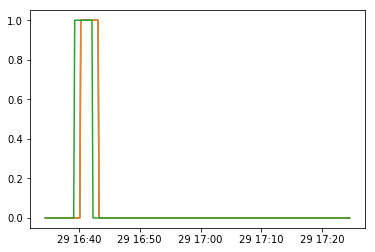

In [220]:
plt.plot(d_df_resample_all[2]['leaf1']['Anomaly_orig'])
plt.plot(d_df_resample_all[2]['leaf1']['Anomaly'])
plt.plot(d_df_resample_all[2]['leaf1']['Anomaly_shift_6'])

In [221]:
feature_cols=df_2.dtypes=='float64'
feature_cols=df_2.columns[feature_cols].tolist()

In [222]:
feature_cols

['acl-in-rpf-packets',
 'active-routes-count',
 'as',
 'backup-routes-count',
 'bandwidth',
 'bytes-received',
 'bytes-sent',
 'carrier-transitions',
 'checksum-error-packets',
 'crc-errors',
 'deleted-routes-count',
 'df-unreachable-packets',
 'discard-packets',
 'encapsulation-failure-packets',
 'fragmenation-consumed-packets',
 'fragmenation-failure-packets',
 'free-application-memory',
 'free-physical-memory',
 'global__established-neighbors-count-total',
 'global__neighbors-count-total',
 'global__nexthop-count',
 'global__restart-count',
 'gre-error-drop',
 'gre-lookup-failed-drop',
 'incomplete-adjacency-packets',
 'input-data-rate',
 'input-drops',
 'input-errors',
 'input-ignored-packets',
 'input-load',
 'input-packet-rate',
 'input-queue-drops',
 'lisp-decap-error-drops',
 'lisp-encap-error-drops',
 'lisp-punt-drops',
 'load-interval',
 'mpls-disabled-interface',
 'multi-label-drops',
 'no-route-packets',
 'null-packets',
 'output-buffer-failures',
 'output-data-rate',
 'out

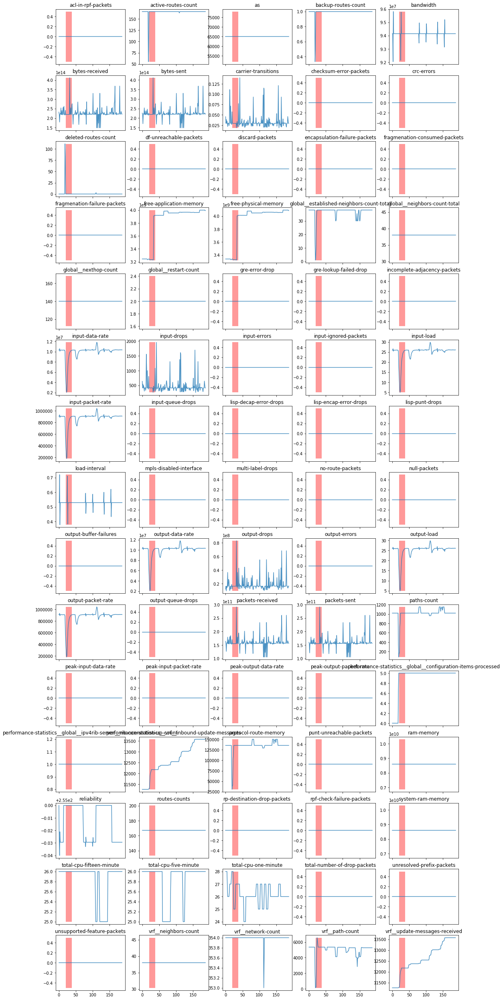

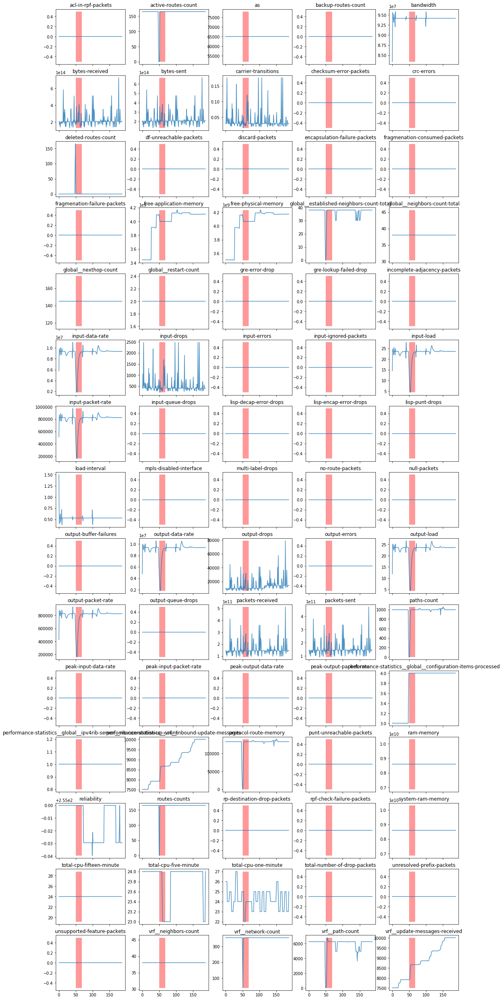

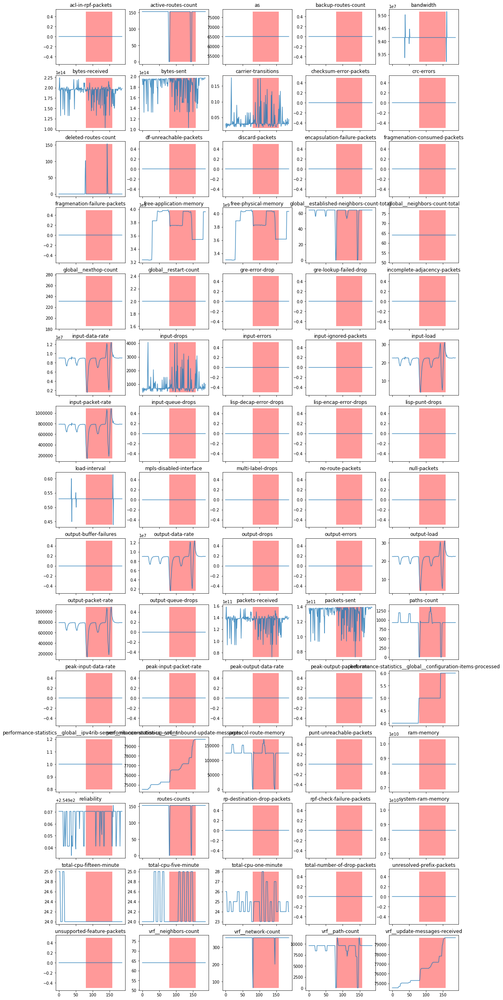

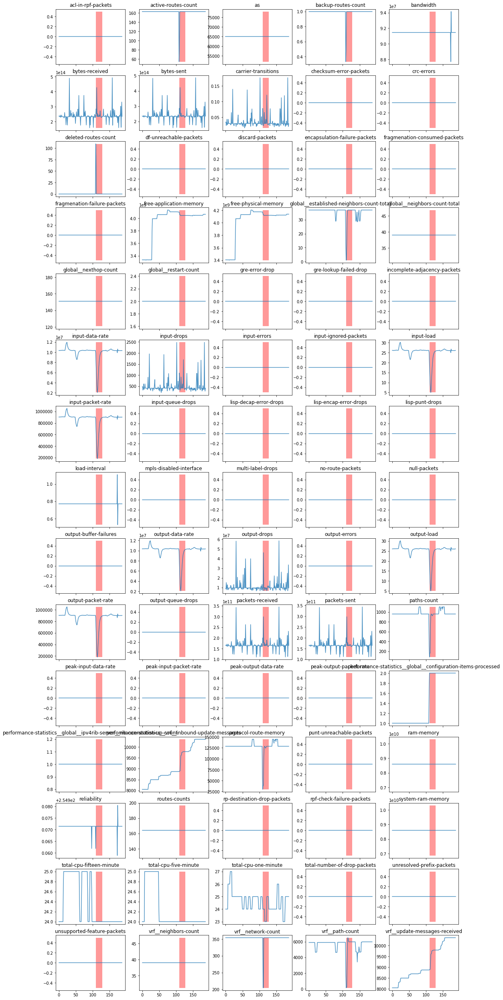

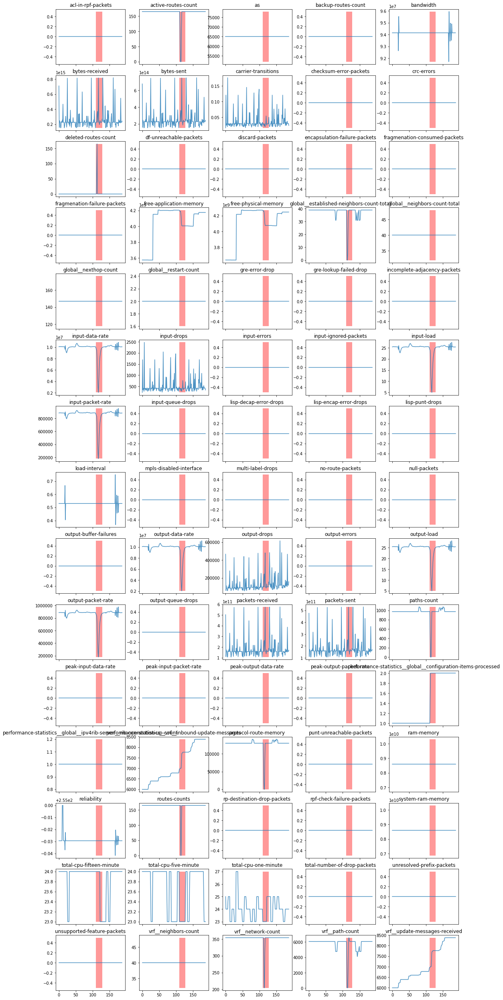

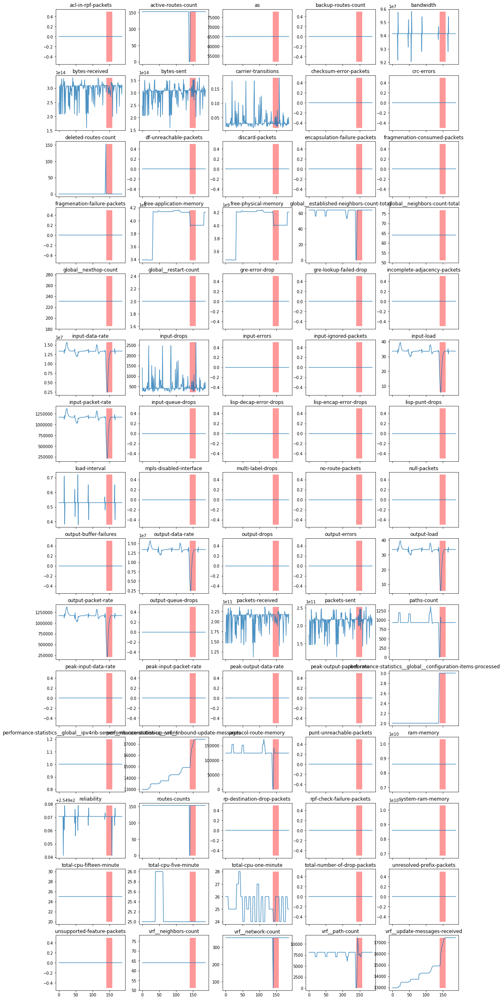

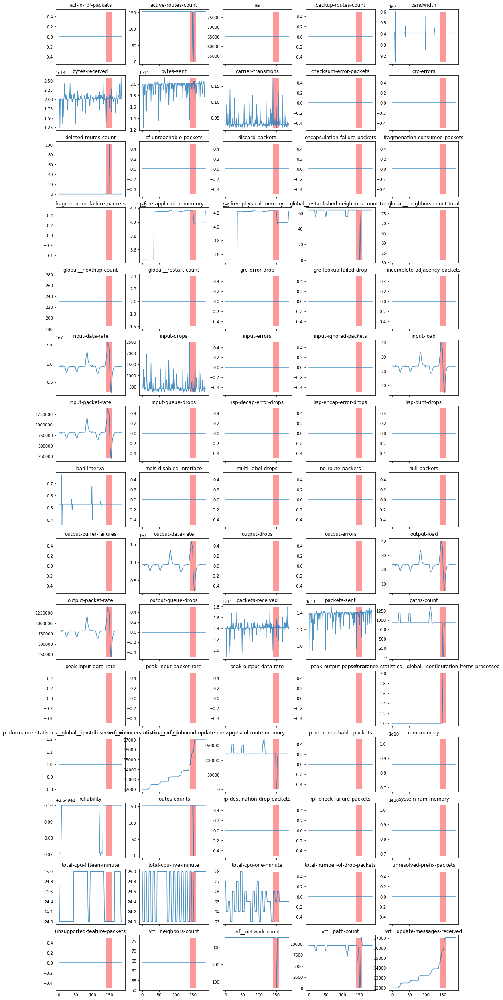

In [167]:
i=3
for j in d_df_resample_all[i].keys():
    visualize(d_df_resample_all[i][j][feature_cols].values, d_df_resample_all[i][j]['Anomaly'].values, 
              columns=feature_cols)
    plt.show()

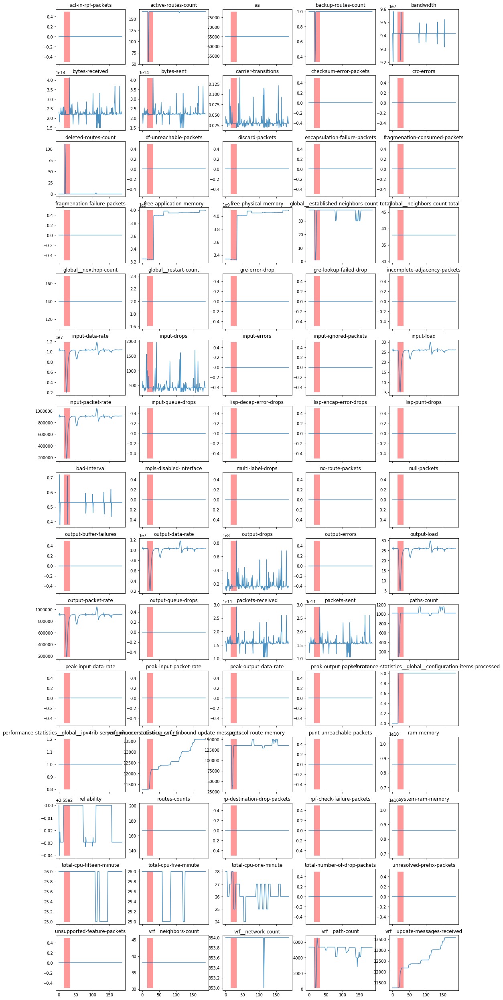

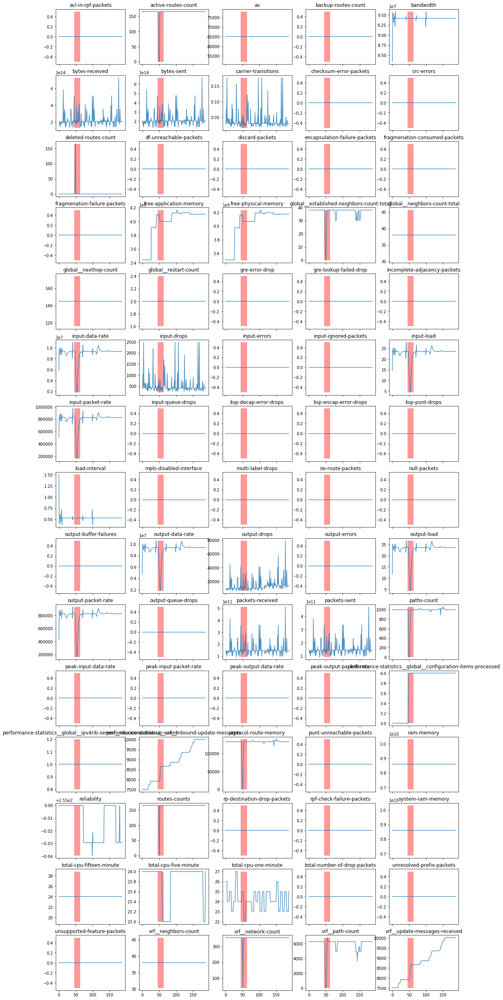

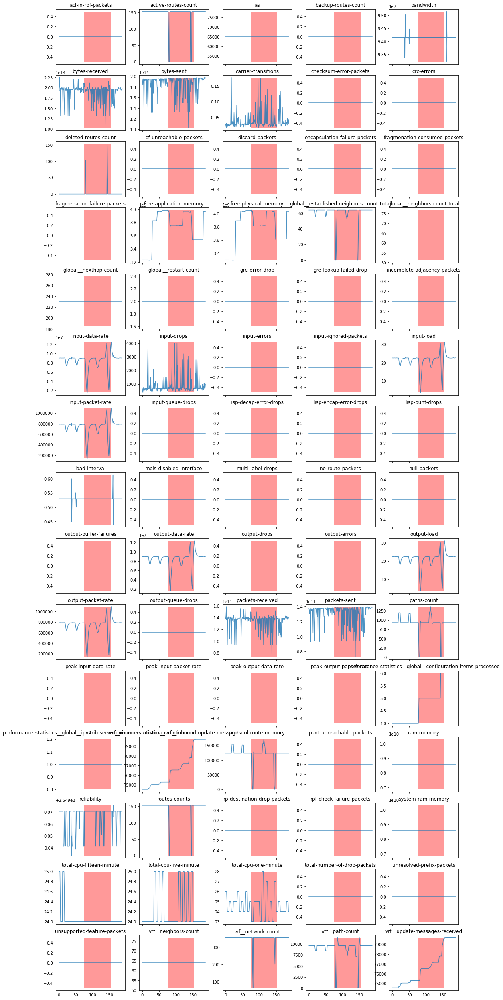

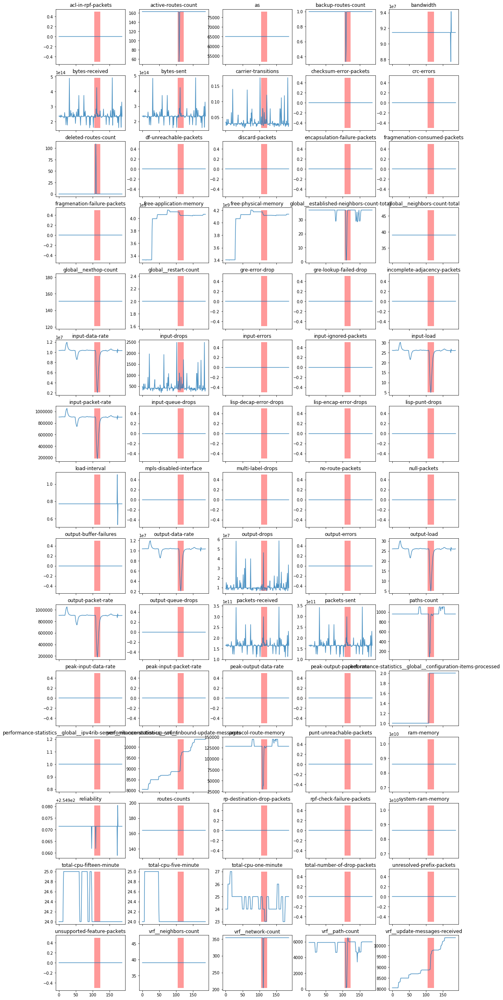

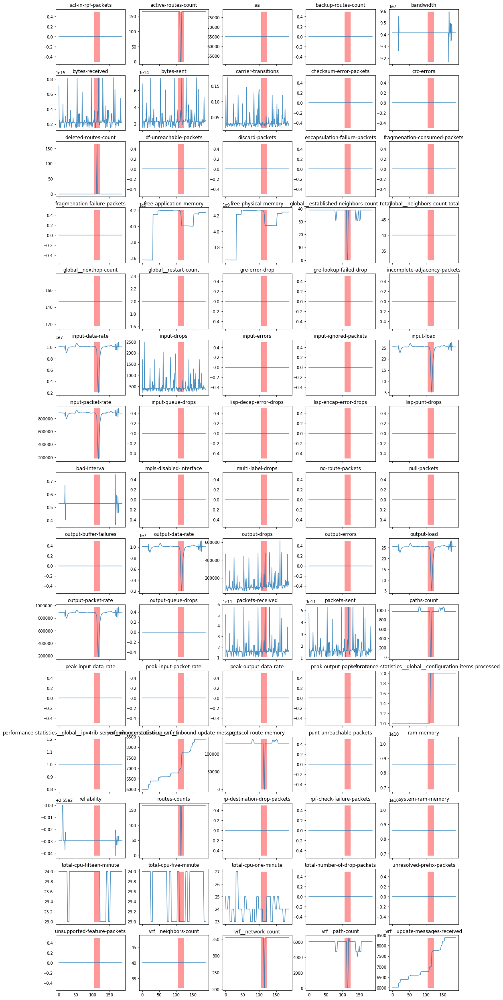

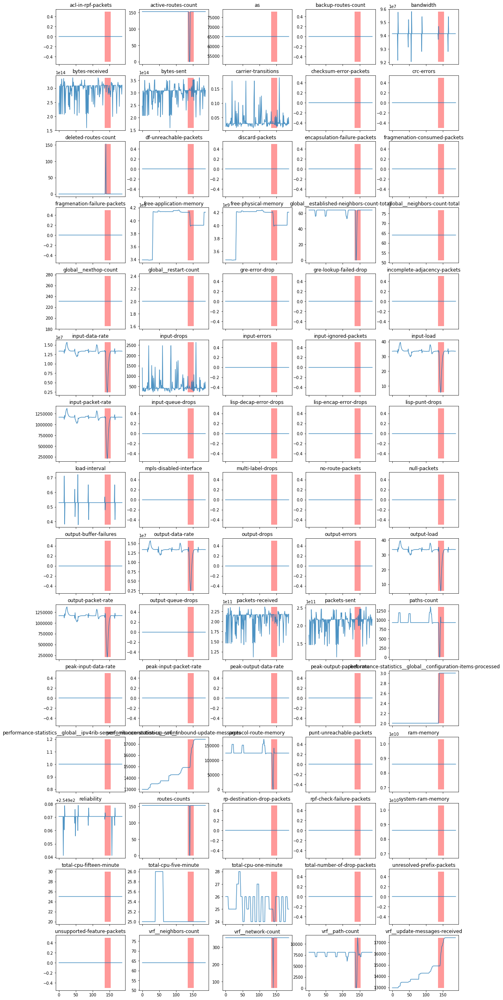

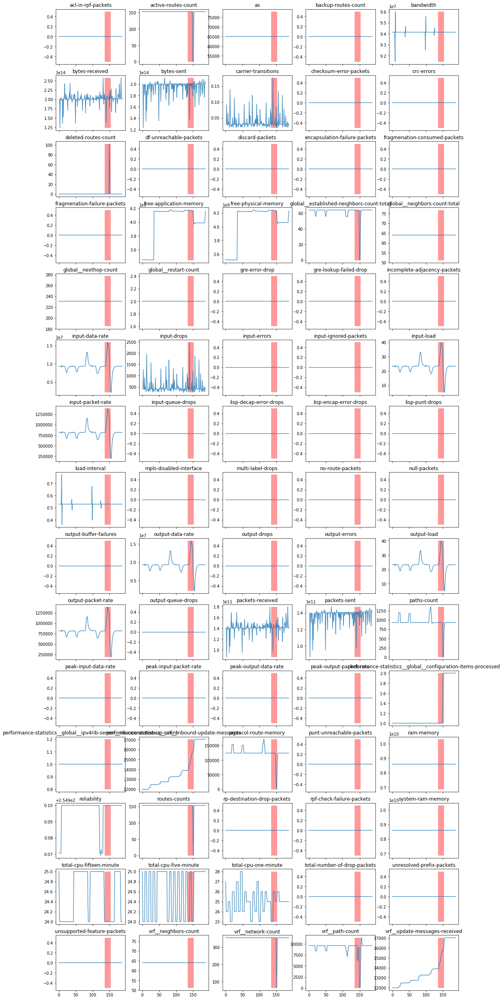

In [168]:
plt.close('all')
i=3
for j in d_df_resample_all[i].keys():
    visualize(d_df_resample_all[i][j][feature_cols].values, d_df_resample_all[i][j]['Anomaly_shift_5'].values, 
              columns=feature_cols)
    plt.show()

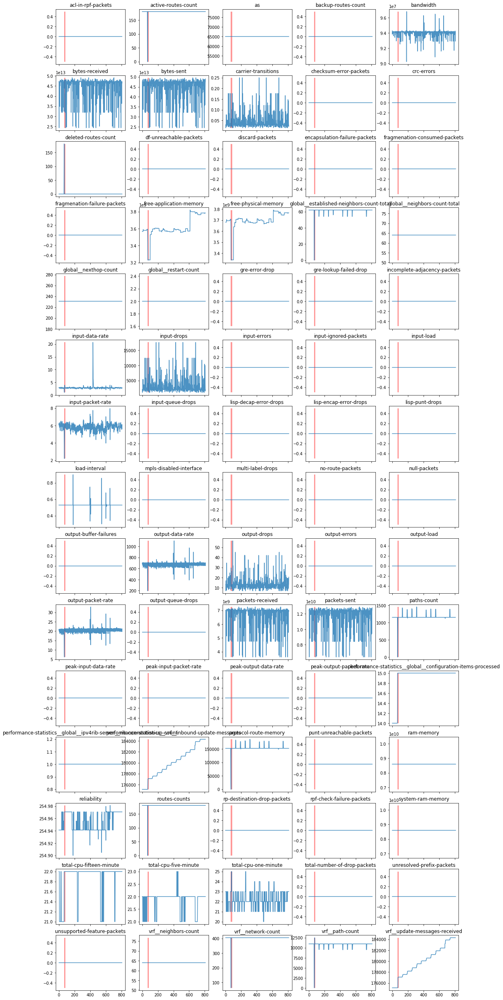

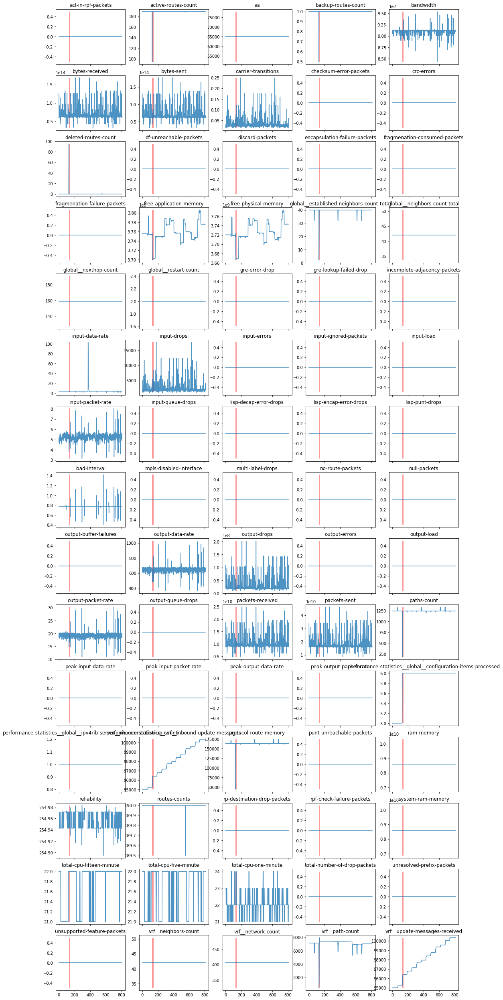

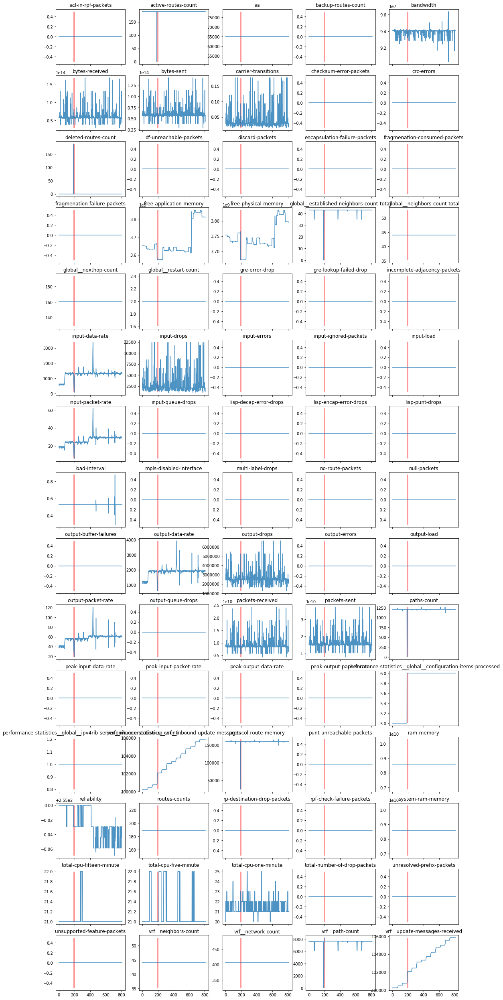

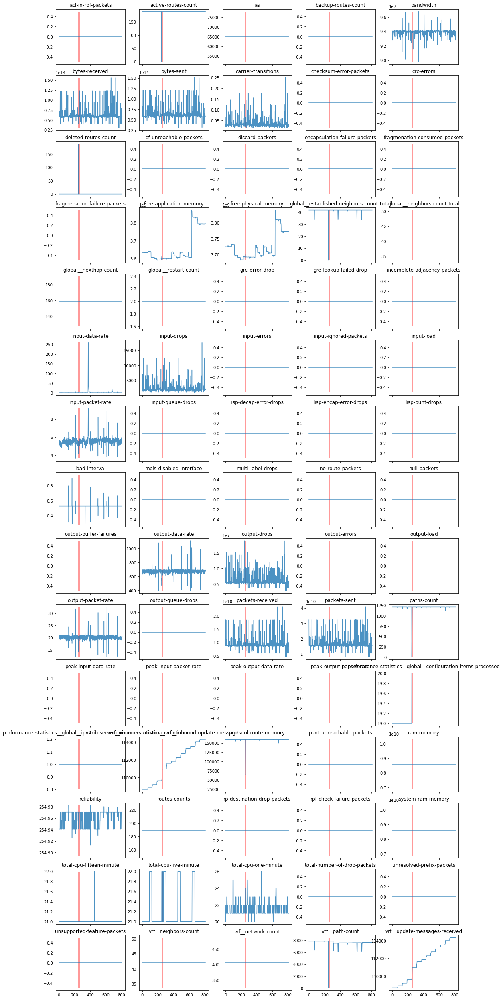

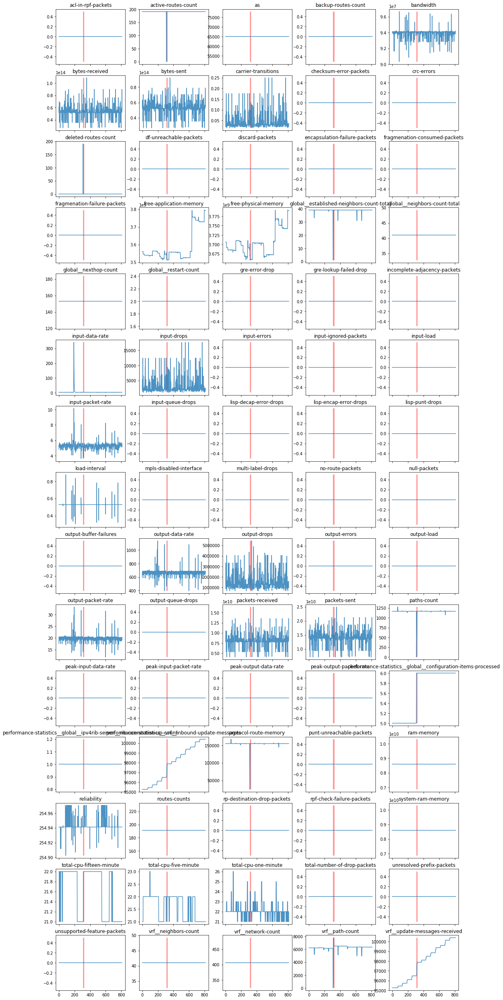

...

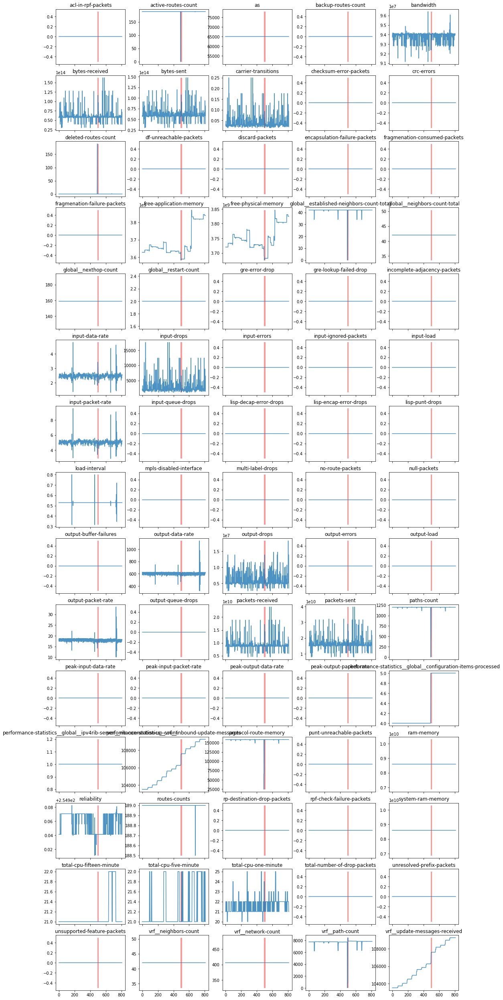

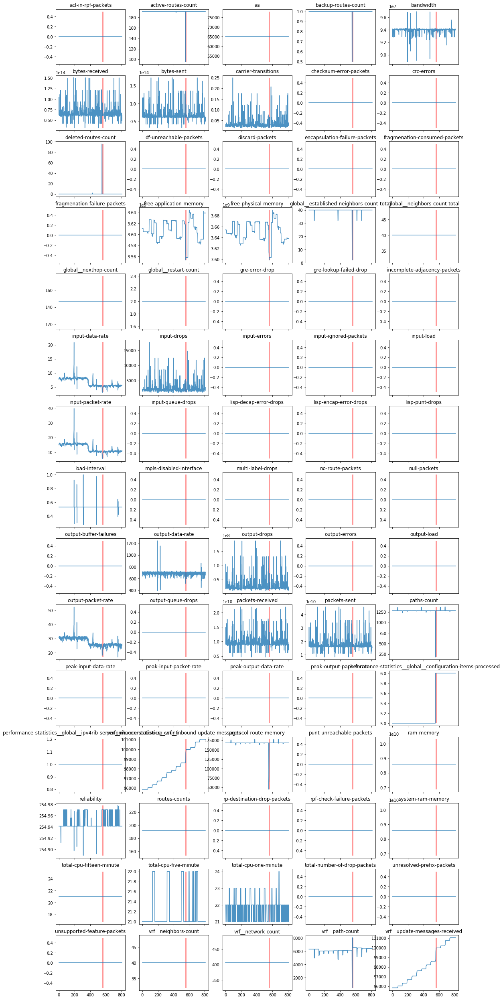

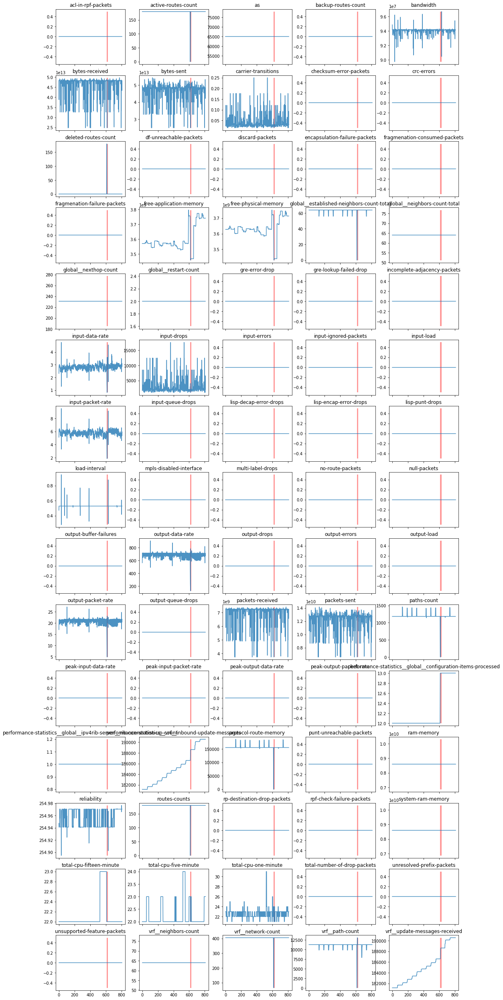

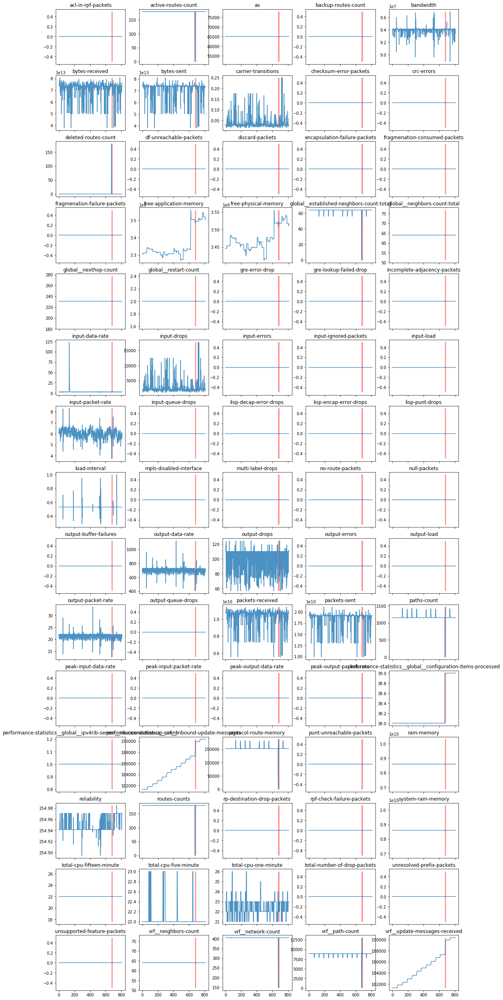

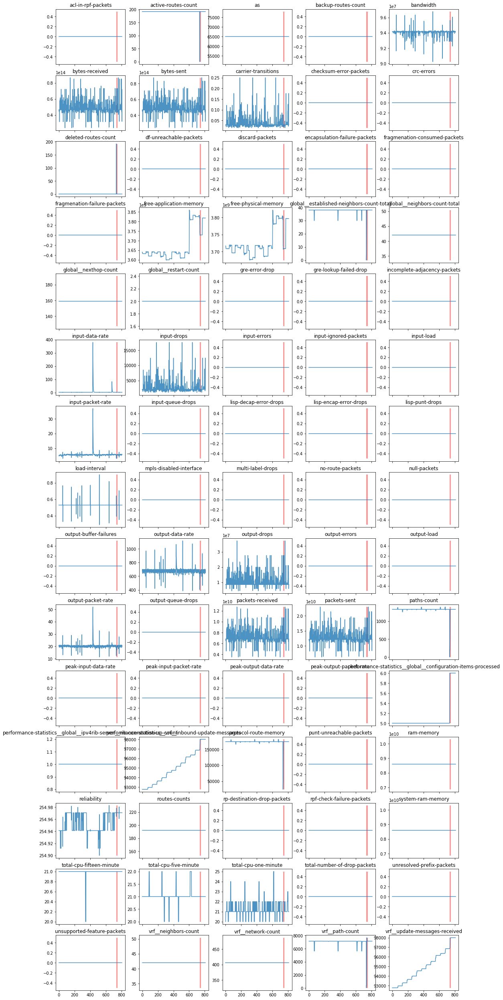

In [169]:
plt.close('all')
i=6
for j in d_df_resample_all[i].keys():
    visualize(d_df_resample_all[i][j][feature_cols].values, d_df_resample_all[i][j]['Anomaly'].values, 
              columns=feature_cols)
    plt.show()

Concatenate all data and get rid of features that are constant all the times. It will end up with 40 features.

In [223]:
df_tmp=pd.concat(list(d_df_resample_all[2].values()) + list(d_df_resample_all[3].values()) + \
                 list(d_df_resample_all[5].values()) + list(d_df_resample_all[6].values()))

In [224]:
df_tmp.shape

(23174, 87)

In [225]:
df_tmp.isna().sum()

acl-in-rpf-packets                               0
active-routes-count                              0
as                                               0
backup-routes-count                              0
bandwidth                                        0
bytes-received                                   0
bytes-sent                                       0
carrier-transitions                              0
checksum-error-packets                           0
crc-errors                                       0
deleted-routes-count                             0
df-unreachable-packets                           0
discard-packets                                  0
encapsulation-failure-packets                    0
fragmenation-consumed-packets                    0
fragmenation-failure-packets                     0
free-application-memory                          0
free-physical-memory                             0
global__established-neighbors-count-total        0
global__neighbors-count-total  

In [226]:
df_tmp.describe()

,acl-in-rpf-packets,active-routes-count,as,backup-routes-count,bandwidth,bytes-received,bytes-sent,carrier-transitions,checksum-error-packets,crc-errors,...,total-number-of-drop-packets,unresolved-prefix-packets,unsupported-feature-packets,vrf__neighbors-count,vrf__network-count,vrf__path-count,vrf__update-messages-received,Event,Type,Experiment
count,23174.0,23174.000000,23174.000000,23174.000000,2.317400e+04,2.317400e+04,2.317400e+04,23174.000000,23174.0,23174.000000,...,23174.0,23174.0,23174.0,23174.000000,23174.000000,23174.000000,23174.000000,0.0,0.0,23174.000000
mean,0.0,181.398377,65020.194269,0.181604,9.379994e+07,1.902888e+14,1.902473e+14,0.037050,0.0,0.002454,...,0.0,0.0,0.0,49.698844,396.980294,7949.419076,123068.024172,NaN,NaN,4.994735
std,0.0,16.679941,6.090584,0.385363,9.090638e+05,3.386723e+14,3.372749e+14,0.027986,0.0,0.008738,...,0.0,0.0,0.0,10.736221,22.640322,1952.727131,48780.675474,NaN,NaN,1.257118
min,0.0,0.000000,65011.000000,0.000000,8.341667e+07,2.394979e+13,2.410480e+13,0.015152,0.0,0.000000,...,0.0,0.0,0.0,38.000000,39.000000,39.000000,5998.000000,NaN,NaN,2.000000
25%,0.0,180.000000,65013.000000,0.000000,9.405240e+07,5.732505e+13,5.716507e+13,0.028666,0.0,0.000000,...,0.0,0.0,0.0,42.000000,406.000000,6931.000000,97610.000000,NaN,NaN,5.000000
50%,0.0,189.000000,65022.000000,0.000000,9.409095e+07,7.383763e+13,7.397165e+13,0.029412,0.0,0.000000,...,0.0,0.0,0.0,42.000000,406.000000,7592.000000,108953.000000,NaN,NaN,5.000000
75%,0.0,191.000000,65026.000000,0.000000,9.414706e+07,1.030255e+14,1.030012e+14,0.029412,0.0,0.000000,...,0.0,0.0,0.0,64.000000,406.000000,8899.000000,178790.000000,NaN,NaN,6.000000
max,0.0,192.000000,65028.000000,1.000000,9.969490e+07,3.881446e+15,3.971809e+15,0.250000,0.0,0.059374,...,0.0,0.0,0.0,64.000000,406.000000,13057.000000,209436.000000,NaN,NaN,6.000000


In [227]:
df_tmp.std()>0

acl-in-rpf-packets                                      False
active-routes-count                                      True
as                                                       True
backup-routes-count                                      True
bandwidth                                                True
bytes-received                                           True
bytes-sent                                               True
carrier-transitions                                      True
checksum-error-packets                                  False
crc-errors                                               True
deleted-routes-count                                     True
df-unreachable-packets                                  False
discard-packets                                         False
encapsulation-failure-packets                           False
fragmenation-consumed-packets                           False
fragmenation-failure-packets                            False
free-app

In [228]:
valid_feature_cols=df_tmp[feature_cols].std()>0
valid_feature_cols=df_tmp[feature_cols].columns[valid_feature_cols]

In [229]:
valid_feature_cols.shape

(40,)

# now the data is all parsed and ready. how do we partition them? Let's say every 14 minutes (delta) and 1 minute skip between two consecutive samples

In [230]:
# d_df_all[key]=d_df_node
# d_df_resample_all[key]=d_df_node_resample
final_feature_cols=valid_feature_cols.tolist()
anomaly_cols=[i for i in d_df_resample_all[2]['leaf1'].columns if 'Anomaly' in i]
final_feature_cols=final_feature_cols + ['time', 'Experiment'] + anomaly_cols
d_df_resample_partitioned={}
positive_list=[]
negative_list=[]
delta=pd.Timedelta(14, unit='minute')
skip=pd.Timedelta(1, unit='minute')
for i, d in d_df_resample_all.items():
    for j, df in d.items():
        t_start = df.index[0]
        t_end = df.index[-1]
        t_total = t_end - t_start
        n_segments=np.floor(t_total/delta).astype(int)
        t1=t_start
        print('%s %s Start:End (%s:%s)' % (i, j, t_start, t_end))
        for segment in range(n_segments):
            t2 = t1 + delta
#             if t2 > t_end:
#                 t2 = t_end
            print('%s %s %d (%s:%s)' % (i, j, segment, t1, t2))
            df_new = df.loc[t1:t2, final_feature_cols]
            df_new['Partition']=segment
            t1=t2 + skip
            key = '%s_%s_%s'%(i, j, segment)
            df_new['time'] = df_new.index
            d_df_resample_partitioned[key]=df_new
            if df_new['Anomaly'].any():
                positive_list.append(df_new)
            else:
                negative_list.append(df_new)
        print()

2 leaf1 Start:End (2017-06-29 16:34:30:2017-06-29 17:24:30)
2 leaf1 0 (2017-06-29 16:34:30:2017-06-29 16:48:30)
2 leaf1 1 (2017-06-29 16:49:30:2017-06-29 17:03:30)
2 leaf1 2 (2017-06-29 17:04:30:2017-06-29 17:18:30)

2 spine4 Start:End (2017-06-29 16:34:30:2017-06-29 17:24:30)
2 spine4 0 (2017-06-29 16:34:30:2017-06-29 16:48:30)
2 spine4 1 (2017-06-29 16:49:30:2017-06-29 17:03:30)
2 spine4 2 (2017-06-29 17:04:30:2017-06-29 17:18:30)

2 leaf8 Start:End (2017-06-29 16:34:30:2017-06-29 17:24:30)
2 leaf8 0 (2017-06-29 16:34:30:2017-06-29 16:48:30)
2 leaf8 1 (2017-06-29 16:49:30:2017-06-29 17:03:30)
2 leaf8 2 (2017-06-29 17:04:30:2017-06-29 17:18:30)

2 spine2 Start:End (2017-06-29 16:34:30:2017-06-29 17:24:20)
2 spine2 0 (2017-06-29 16:34:30:2017-06-29 16:48:30)
2 spine2 1 (2017-06-29 16:49:30:2017-06-29 17:03:30)
2 spine2 2 (2017-06-29 17:04:30:2017-06-29 17:18:30)

2 leaf2 Start:End (2017-06-29 16:34:30:2017-06-29 17:24:20)
2 leaf2 0 (2017-06-29 16:34:30:2017-06-29 16:48:30)
2 leaf2 1 (2

/home/ubuntu/anaconda3/envs/comcast_rnn/lib/python3.6/site-packages/pandas/core/indexing.py:1494: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


2 leaf6 1 (2017-06-29 16:49:30:2017-06-29 17:03:30)
2 leaf6 2 (2017-06-29 17:04:30:2017-06-29 17:18:30)

2 spine1 Start:End (2017-06-29 16:34:30:2017-06-29 17:24:20)
2 spine1 0 (2017-06-29 16:34:30:2017-06-29 16:48:30)
2 spine1 1 (2017-06-29 16:49:30:2017-06-29 17:03:30)
2 spine1 2 (2017-06-29 17:04:30:2017-06-29 17:18:30)

2 spine3 Start:End (2017-06-29 16:34:30:2017-06-29 17:24:30)
2 spine3 0 (2017-06-29 16:34:30:2017-06-29 16:48:30)
2 spine3 1 (2017-06-29 16:49:30:2017-06-29 17:03:30)
2 spine3 2 (2017-06-29 17:04:30:2017-06-29 17:18:30)

3 leaf1 Start:End (2017-08-04 17:16:40:2017-08-04 17:47:50)
3 leaf1 0 (2017-08-04 17:16:40:2017-08-04 17:30:40)
3 leaf1 1 (2017-08-04 17:31:40:2017-08-04 17:45:40)

3 leaf6 Start:End (2017-08-04 17:16:40:2017-08-04 17:47:50)
3 leaf6 0 (2017-08-04 17:16:40:2017-08-04 17:30:40)
3 leaf6 1 (2017-08-04 17:31:40:2017-08-04 17:45:40)

3 spine2 Start:End (2017-08-04 17:16:40:2017-08-04 17:47:50)
3 spine2 0 (2017-08-04 17:16:40:2017-08-04 17:30:40)
3 spine2 

6 spine3 2 (2018-02-19 20:04:10:2018-02-19 20:18:10)
6 spine3 3 (2018-02-19 20:19:10:2018-02-19 20:33:10)
6 spine3 4 (2018-02-19 20:34:10:2018-02-19 20:48:10)
6 spine3 5 (2018-02-19 20:49:10:2018-02-19 21:03:10)
6 spine3 6 (2018-02-19 21:04:10:2018-02-19 21:18:10)
6 spine3 7 (2018-02-19 21:19:10:2018-02-19 21:33:10)
6 spine3 8 (2018-02-19 21:34:10:2018-02-19 21:48:10)

6 leaf2 Start:End (2018-02-19 19:34:10:2018-02-19 21:49:00)
6 leaf2 0 (2018-02-19 19:34:10:2018-02-19 19:48:10)
6 leaf2 1 (2018-02-19 19:49:10:2018-02-19 20:03:10)
6 leaf2 2 (2018-02-19 20:04:10:2018-02-19 20:18:10)
6 leaf2 3 (2018-02-19 20:19:10:2018-02-19 20:33:10)
6 leaf2 4 (2018-02-19 20:34:10:2018-02-19 20:48:10)
6 leaf2 5 (2018-02-19 20:49:10:2018-02-19 21:03:10)
6 leaf2 6 (2018-02-19 21:04:10:2018-02-19 21:18:10)
6 leaf2 7 (2018-02-19 21:19:10:2018-02-19 21:33:10)
6 leaf2 8 (2018-02-19 21:34:10:2018-02-19 21:48:10)

6 leaf8 Start:End (2018-02-19 19:34:10:2018-02-19 21:49:00)
6 leaf8 0 (2018-02-19 19:34:10:2018-02-

In [209]:
d_df_resample_partitioned['2_leaf1_0'].head()

,active-routes-count,as,backup-routes-count,bandwidth,bytes-received,bytes-sent,carrier-transitions,crc-errors,deleted-routes-count,free-application-memory,...,Experiment,Anomaly,Anomaly_orig,Anomaly_shift_1,Anomaly_shift_2,Anomaly_shift_3,Anomaly_shift_4,Anomaly_shift_5,Anomaly_shift_6,Partition
time,,,,,,,,,,,,,,,,,,,,,
2017-06-29 16:34:30,165.0,65021.0,1.0,9.414706e+07,1.316832e+15,1.315751e+15,0.029412,0.0,0.0,3.710376e+09,...,2,False,NaN,False,False,False,False,False,False,0
2017-06-29 16:34:40,165.0,65021.0,1.0,9.414706e+07,1.316844e+15,1.315763e+15,0.029412,0.0,0.0,3.710253e+09,...,2,False,NaN,False,False,False,False,False,False,0
2017-06-29 16:34:50,165.0,65021.0,1.0,9.414706e+07,1.736370e+15,1.666969e+15,0.020915,0.0,0.0,3.710409e+09,...,2,False,NaN,False,False,False,False,False,False,0
2017-06-29 16:35:00,165.0,65021.0,1.0,9.414706e+07,1.316877e+15,1.315797e+15,0.029412,0.0,0.0,3.710177e+09,...,2,False,NaN,False,False,False,False,False,False,0
2017-06-29 16:35:10,165.0,65021.0,1.0,9.414706e+07,1.316893e+15,1.315813e+15,0.029412,0.0,0.0,3.710013e+09,...,2,False,NaN,False,False,False,False,False,False,0


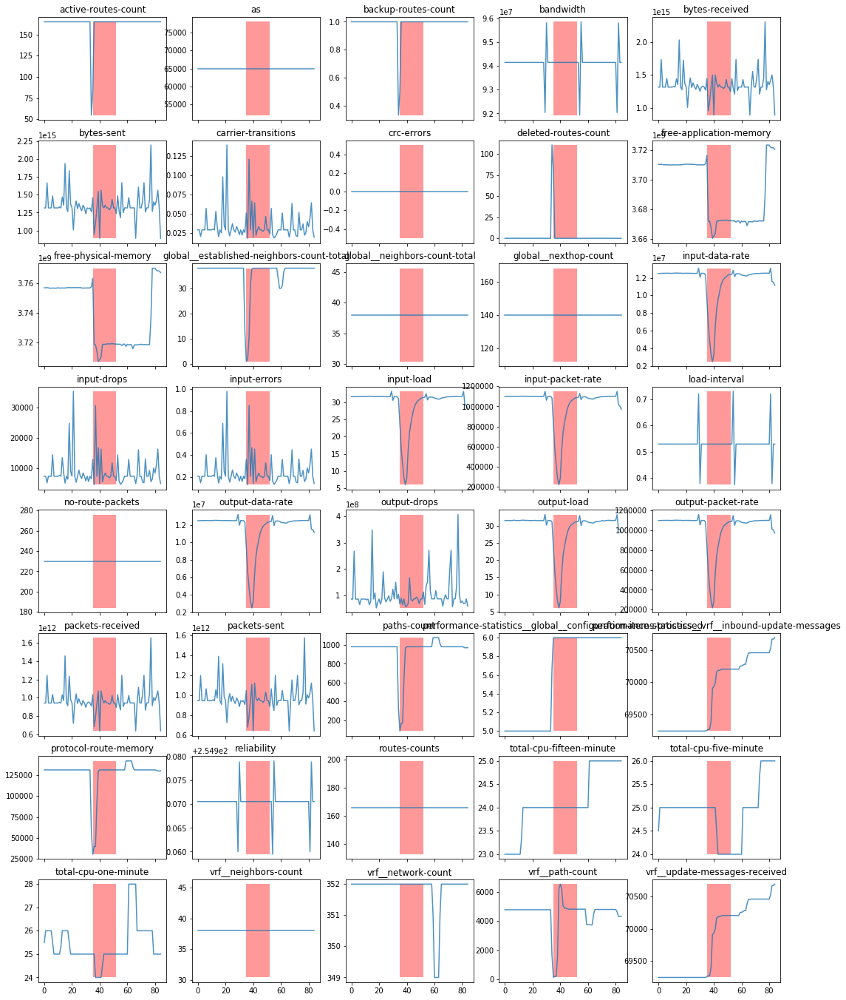

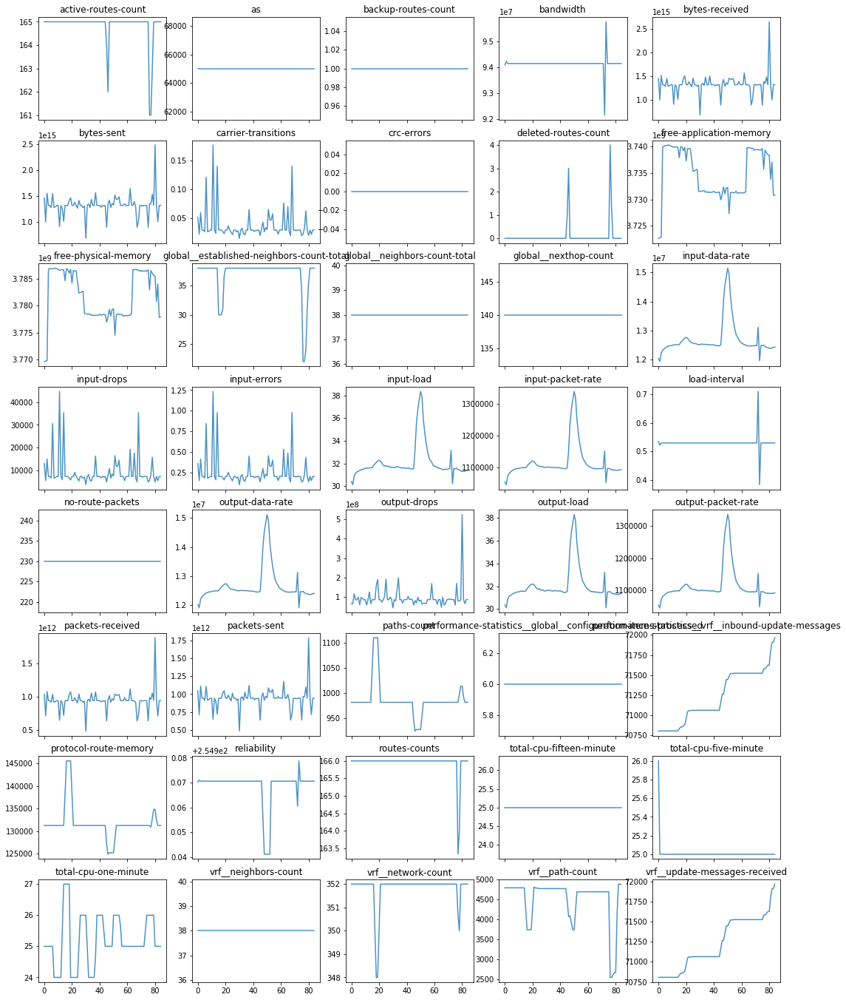

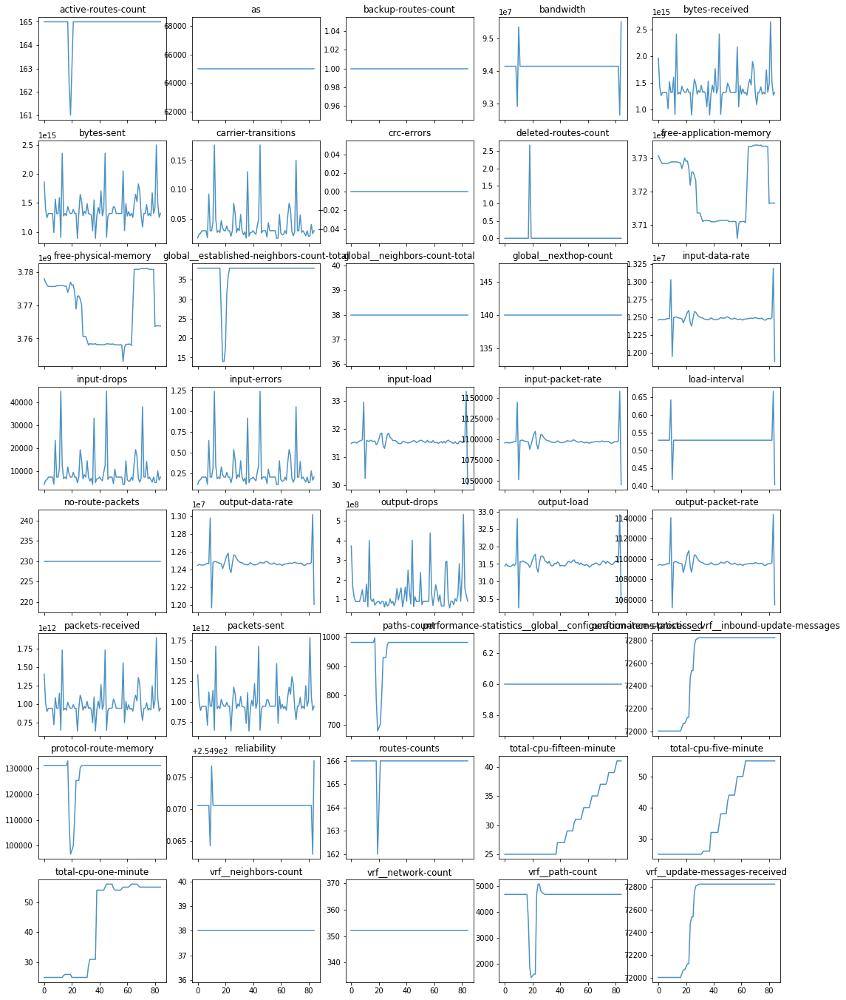

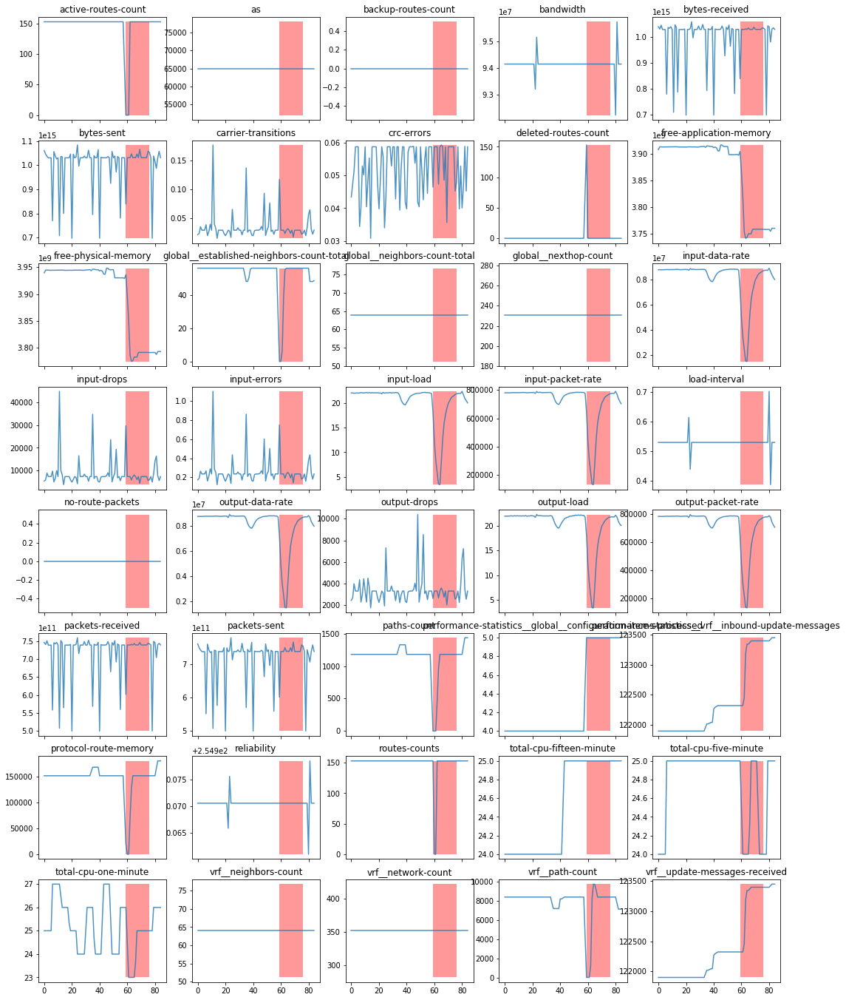

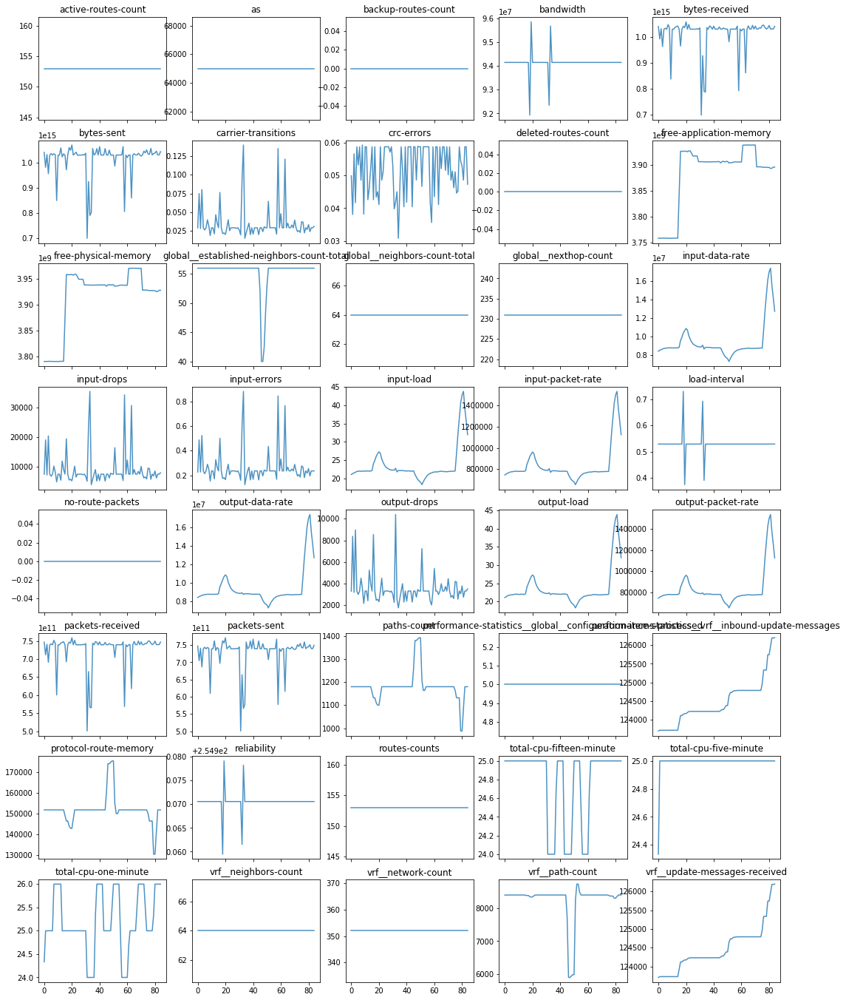

In [186]:
keys=list(d_df_resample_partitioned.keys())
for j in keys[:5]:
    visualize(d_df_resample_partitioned[j][valid_feature_cols].values, d_df_resample_partitioned[j]['Anomaly'].values, 
              columns=valid_feature_cols)
    plt.show()

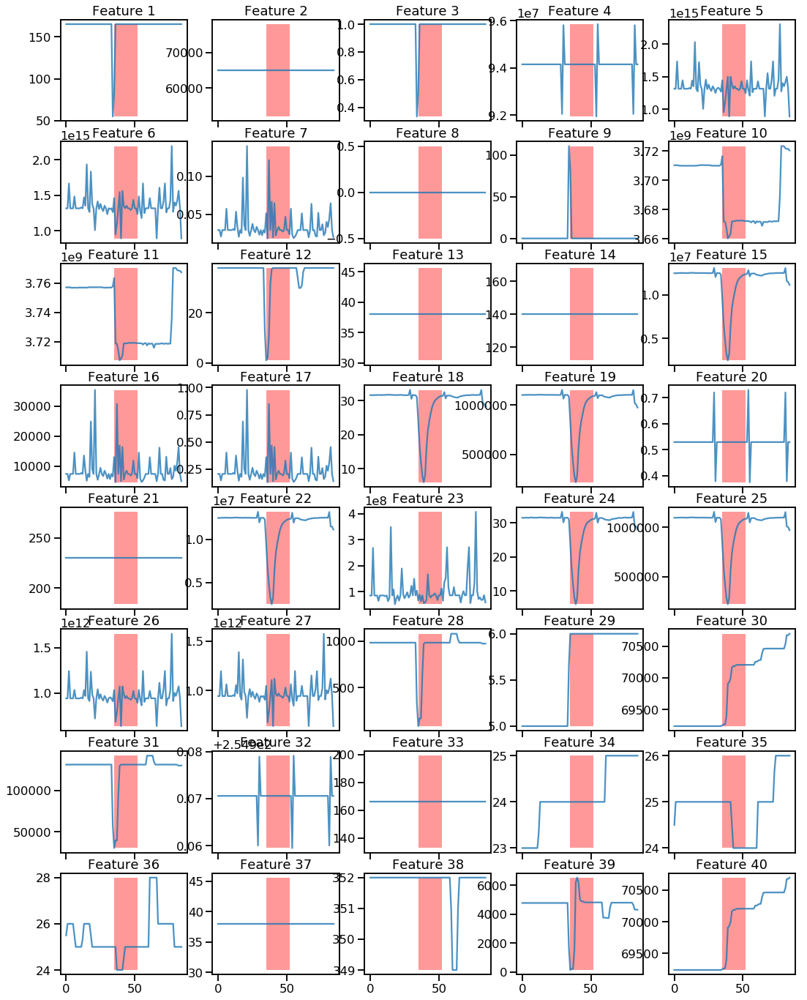

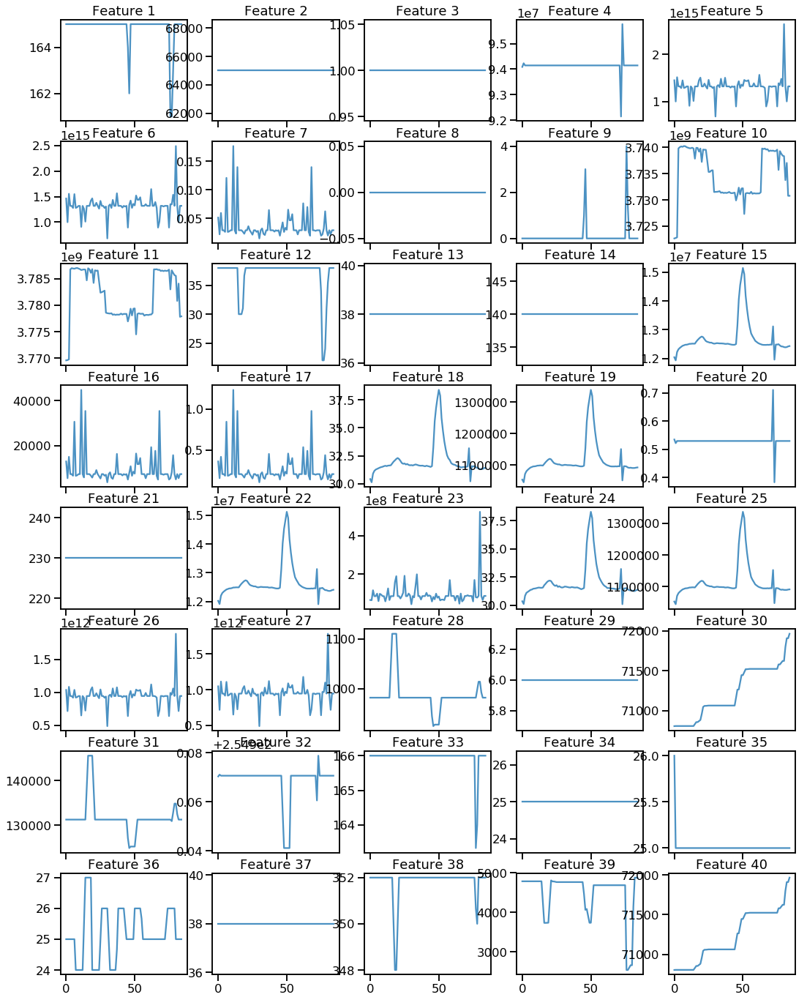

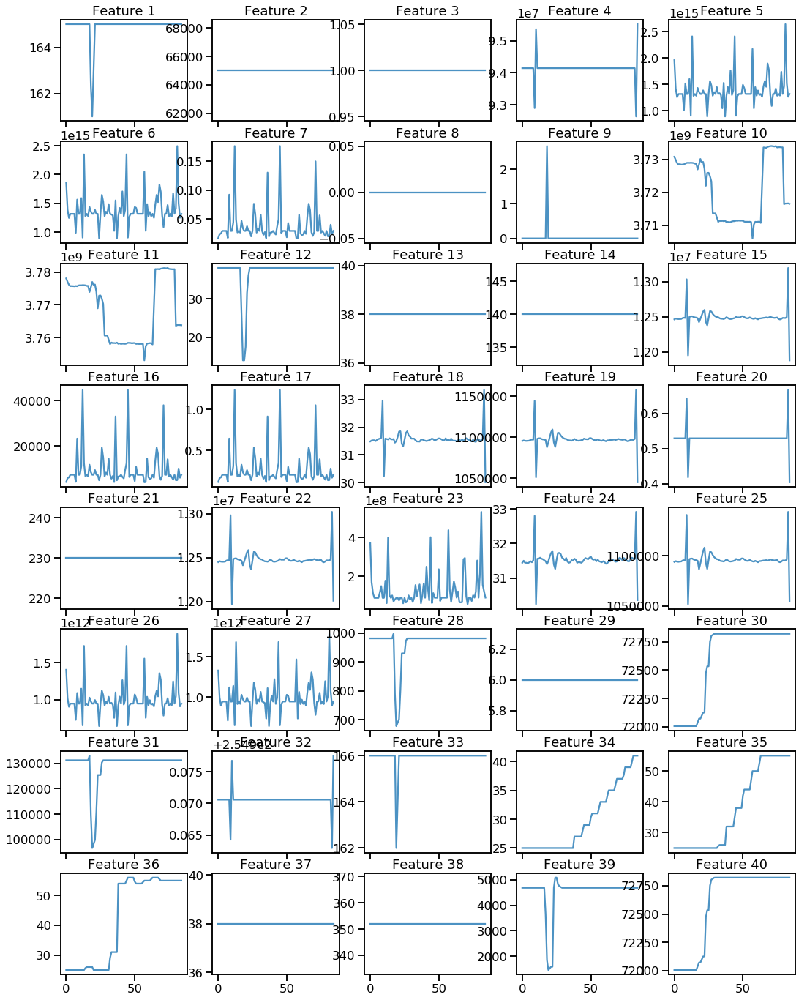

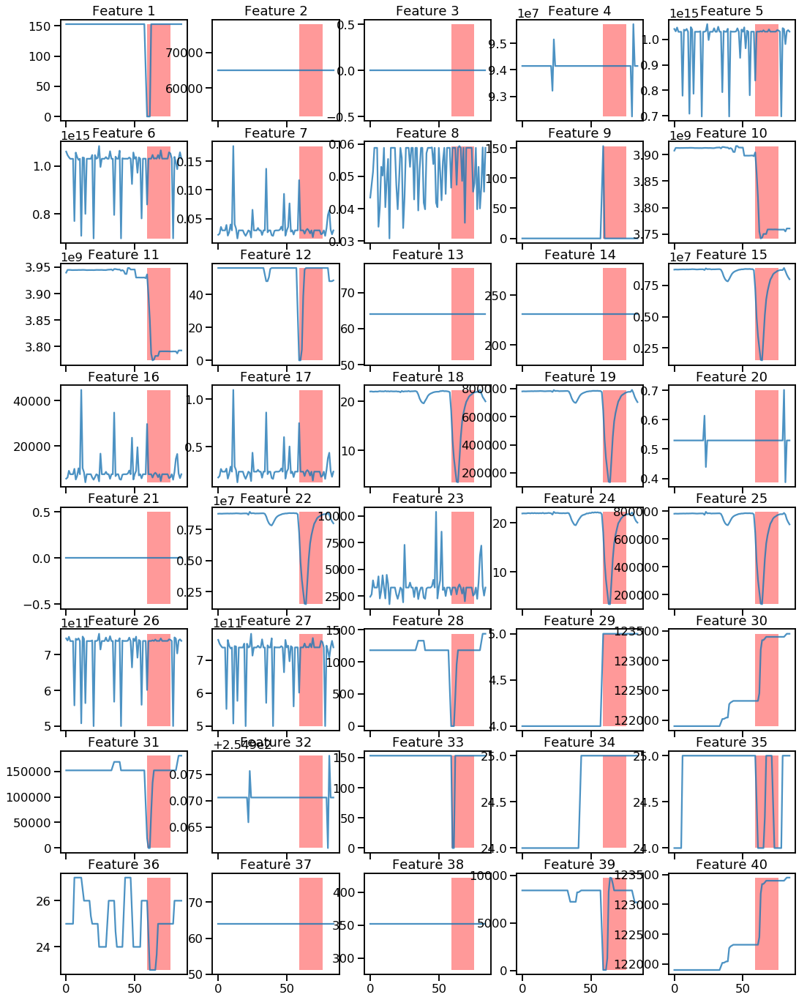

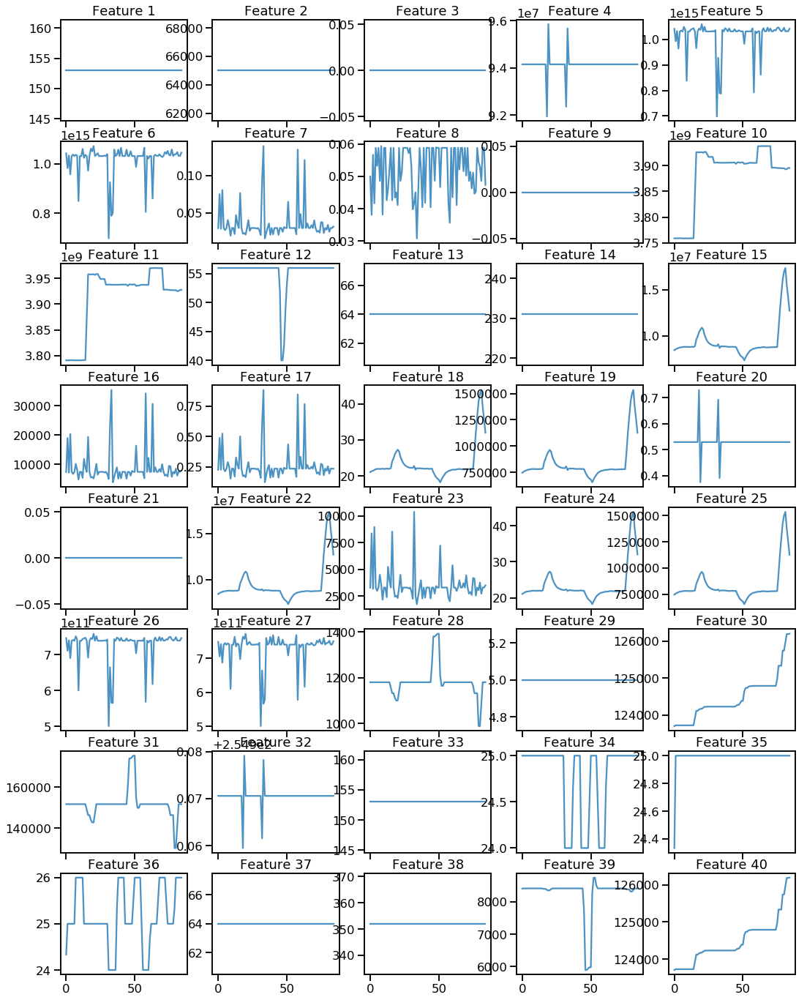

In [241]:
sns.set_context('talk')
keys=list(d_df_resample_partitioned.keys())
for j in keys[:5]:
    visualize(d_df_resample_partitioned[j][valid_feature_cols].values, d_df_resample_partitioned[j]['Anomaly'].values, 
              columns=valid_feature_cols)
    plt.show()

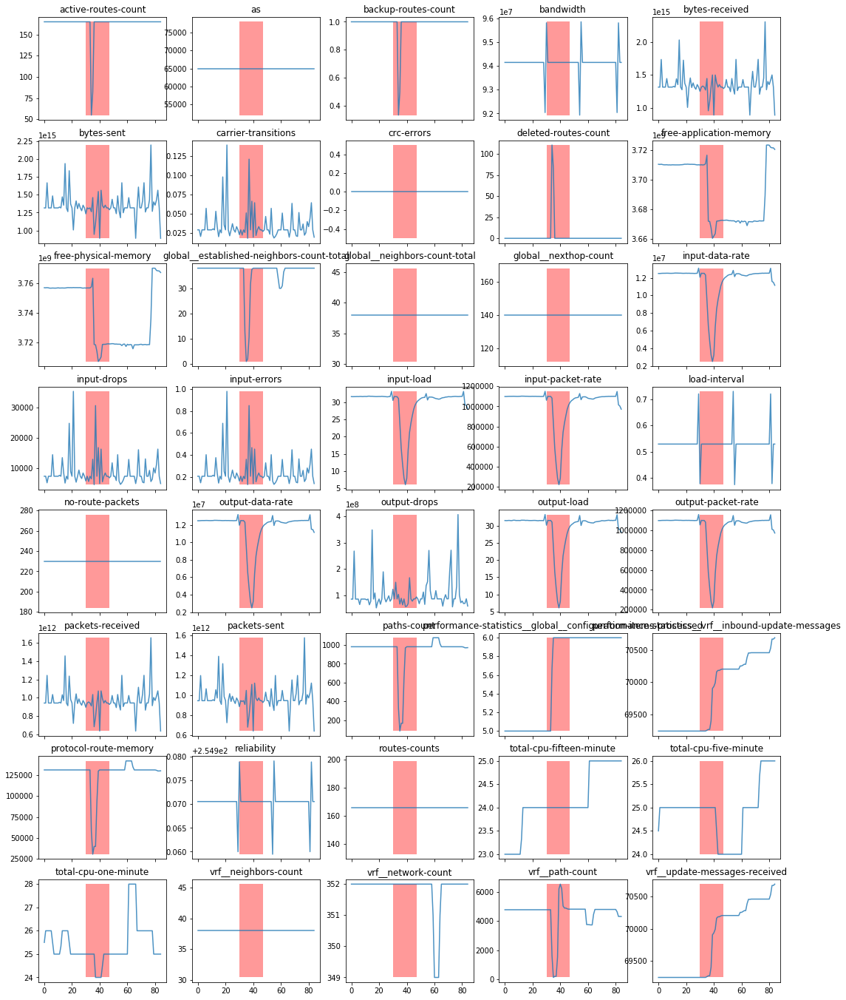

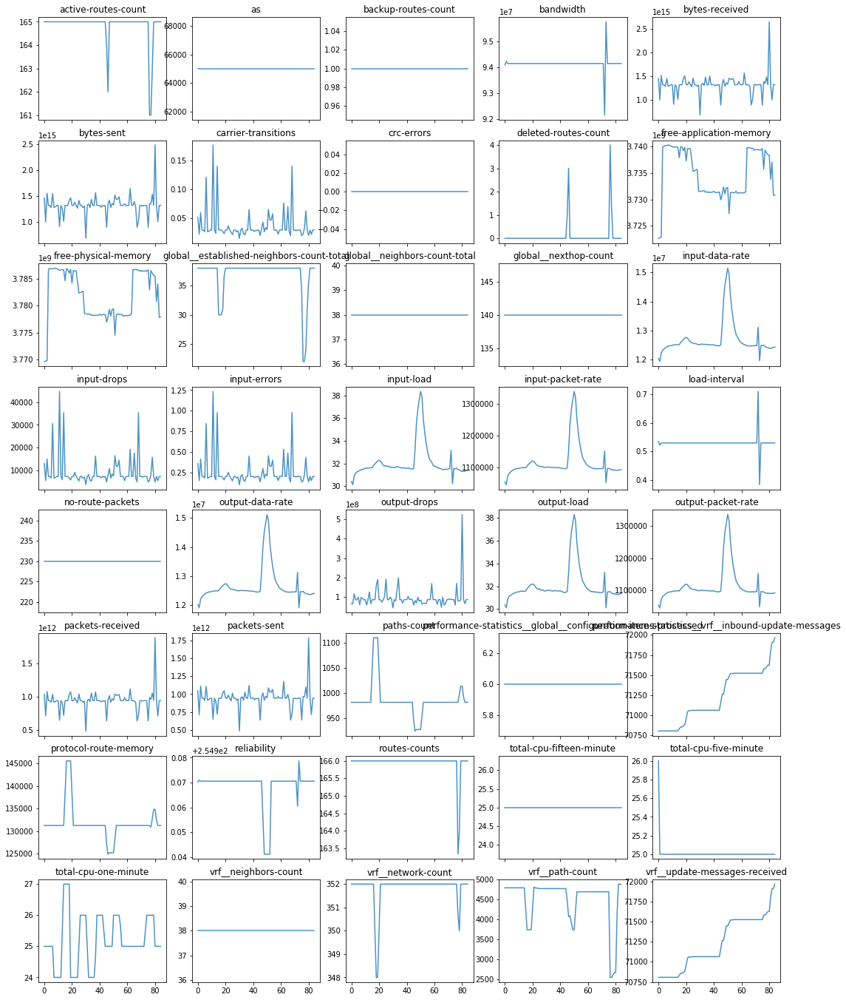

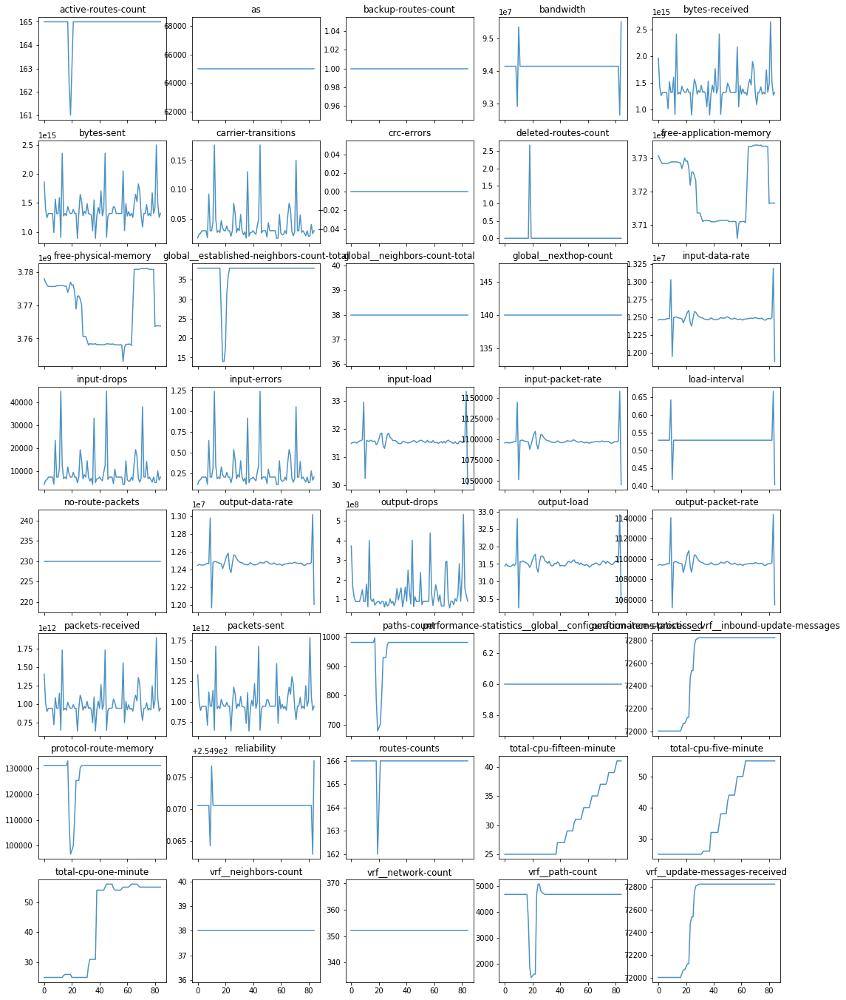

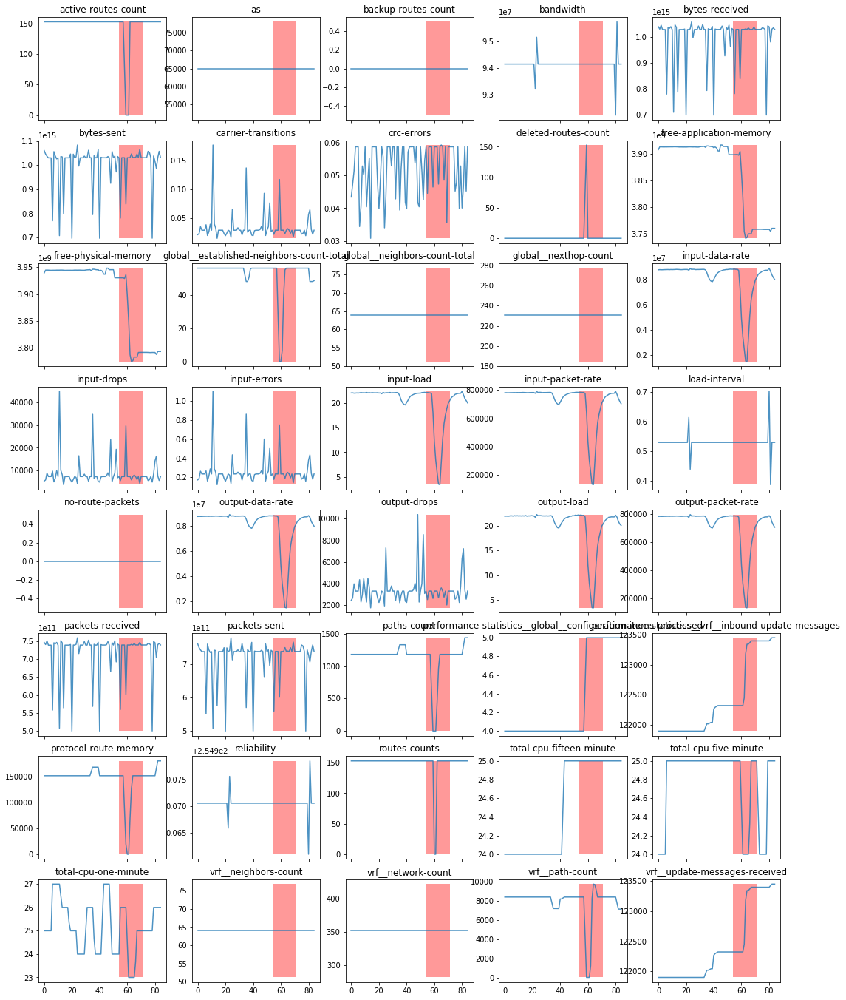

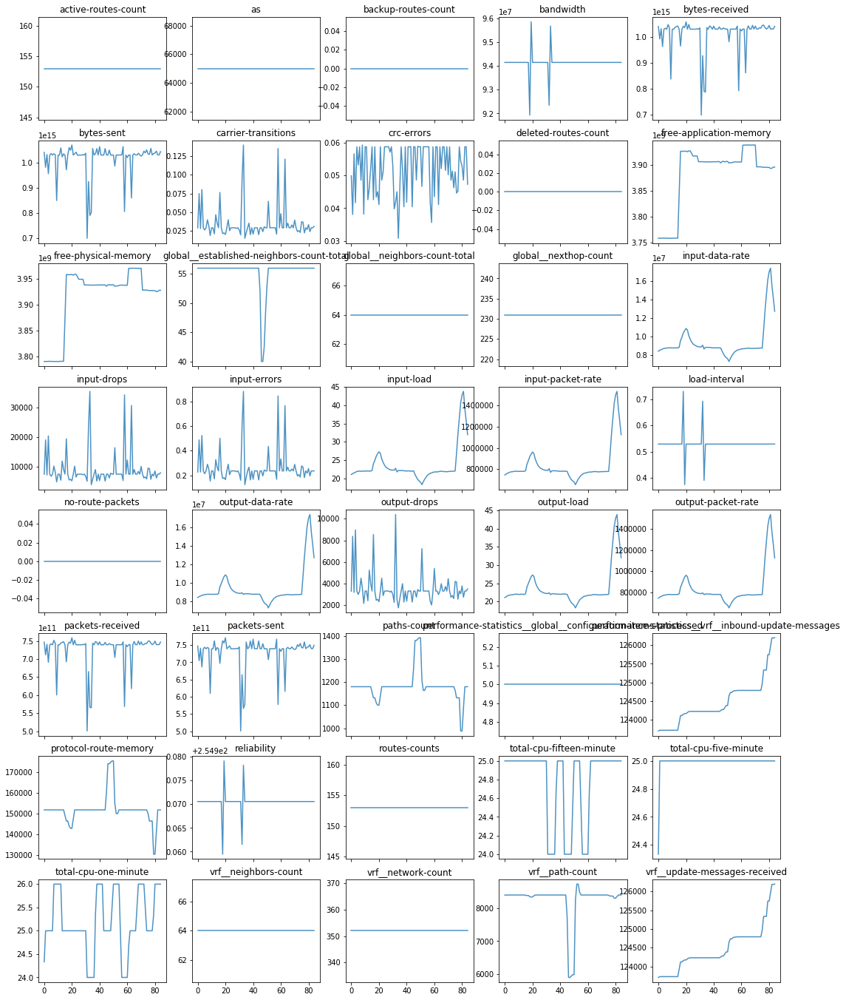

In [187]:
keys=list(d_df_resample_partitioned.keys())
for j in keys[:5]:
    visualize(d_df_resample_partitioned[j][valid_feature_cols].values, d_df_resample_partitioned[j]['Anomaly_shift_5'].values, 
              columns=valid_feature_cols)
    plt.show()

In [188]:
len(positive_list), len(negative_list)

(48, 206)

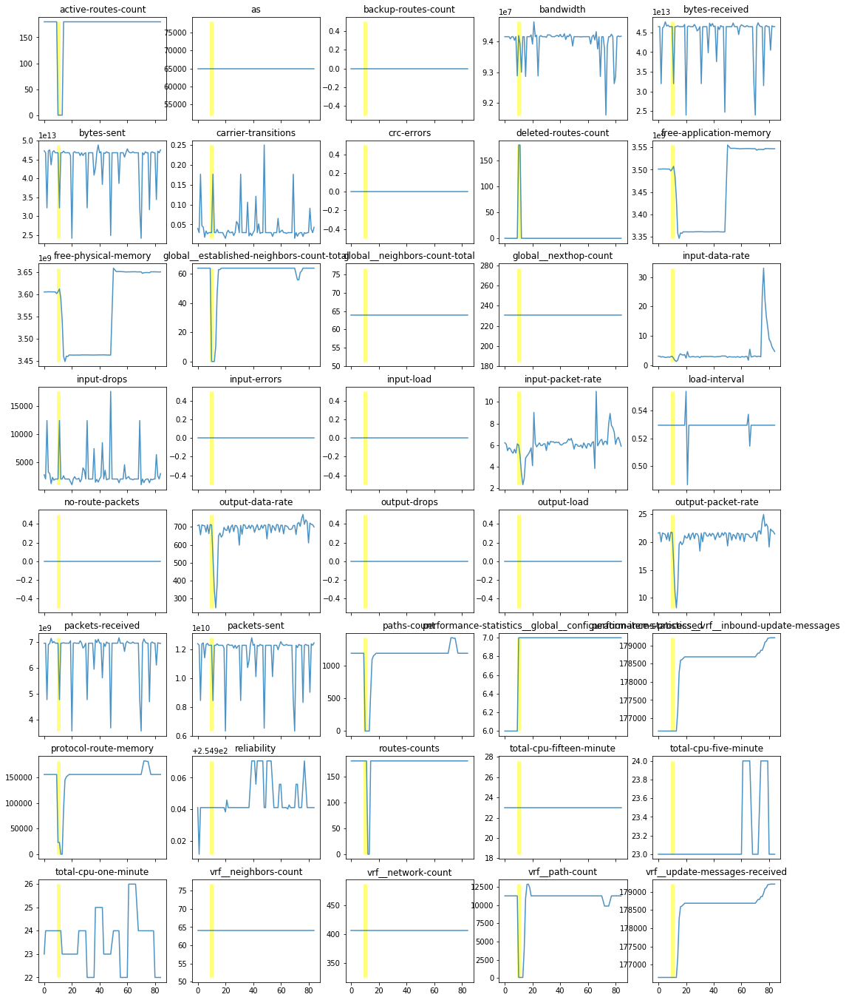

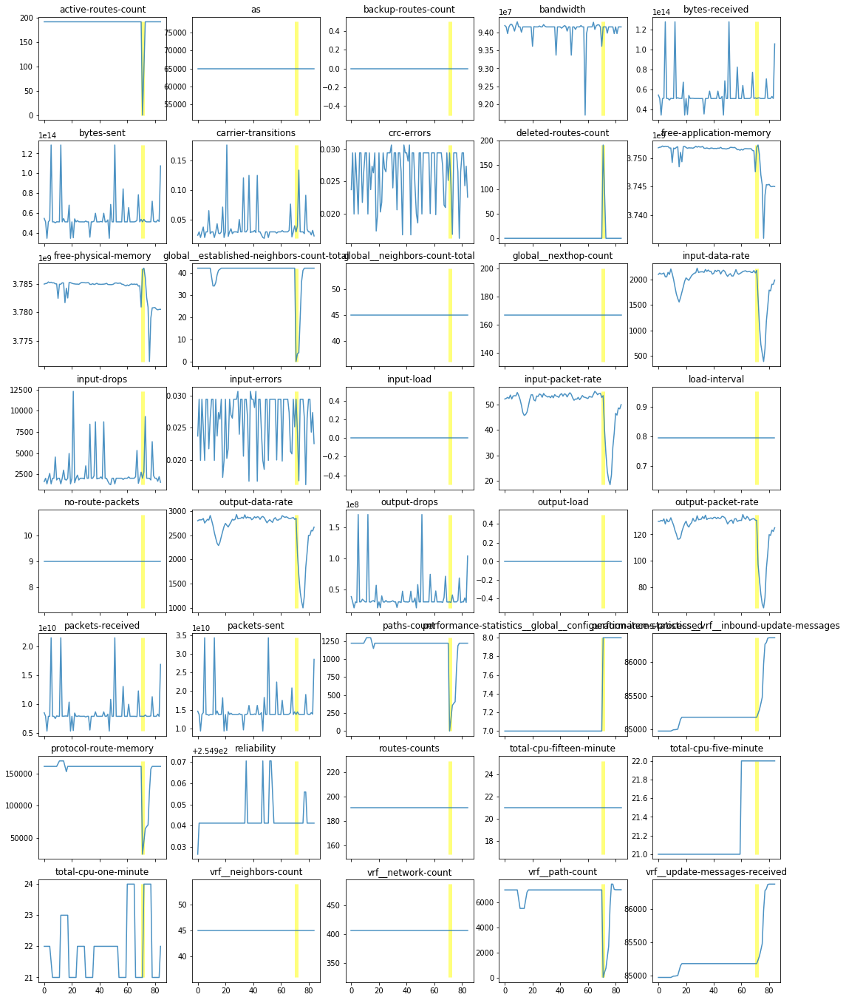

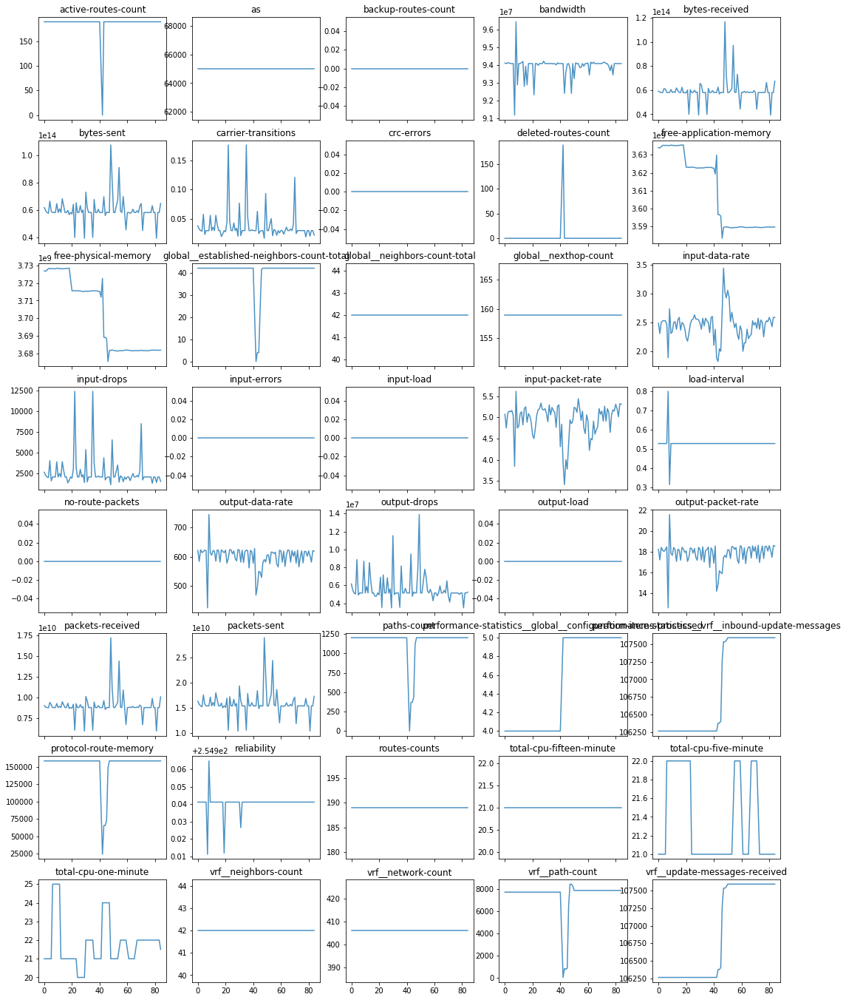

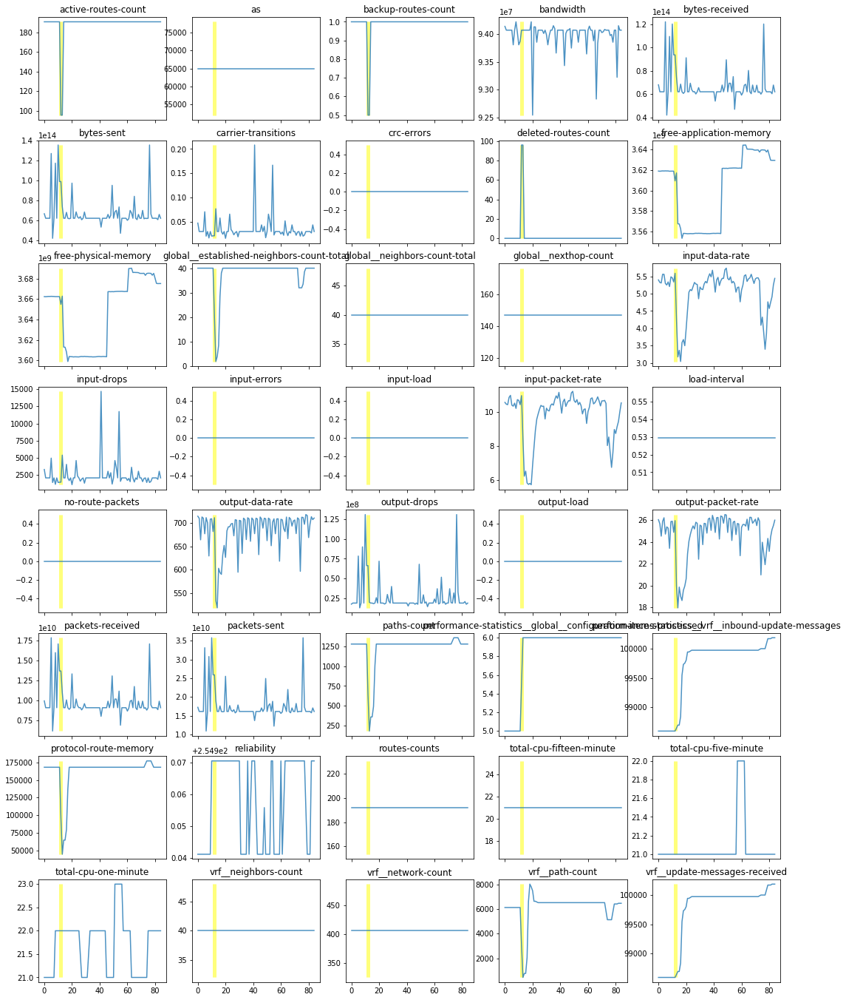

In [231]:
for df in positive_list[40:44]:
    visualize(df[valid_feature_cols].values, df['Anomaly_orig'].values, columns=valid_feature_cols)
    plt.show()

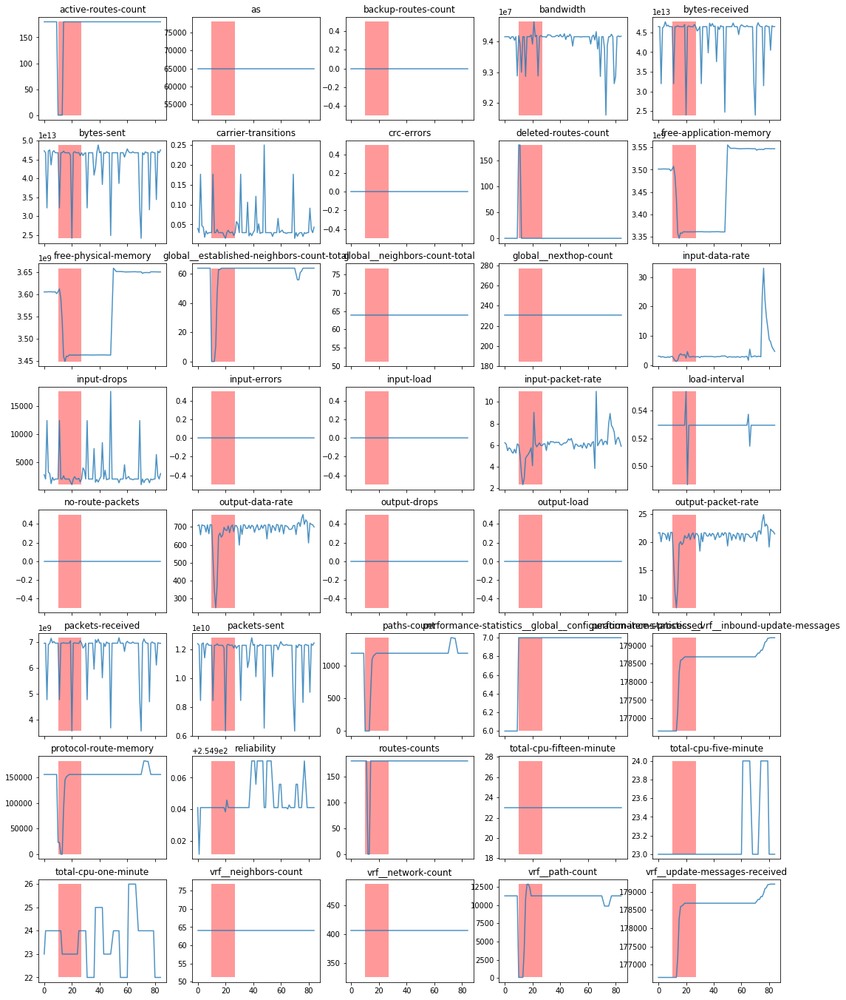

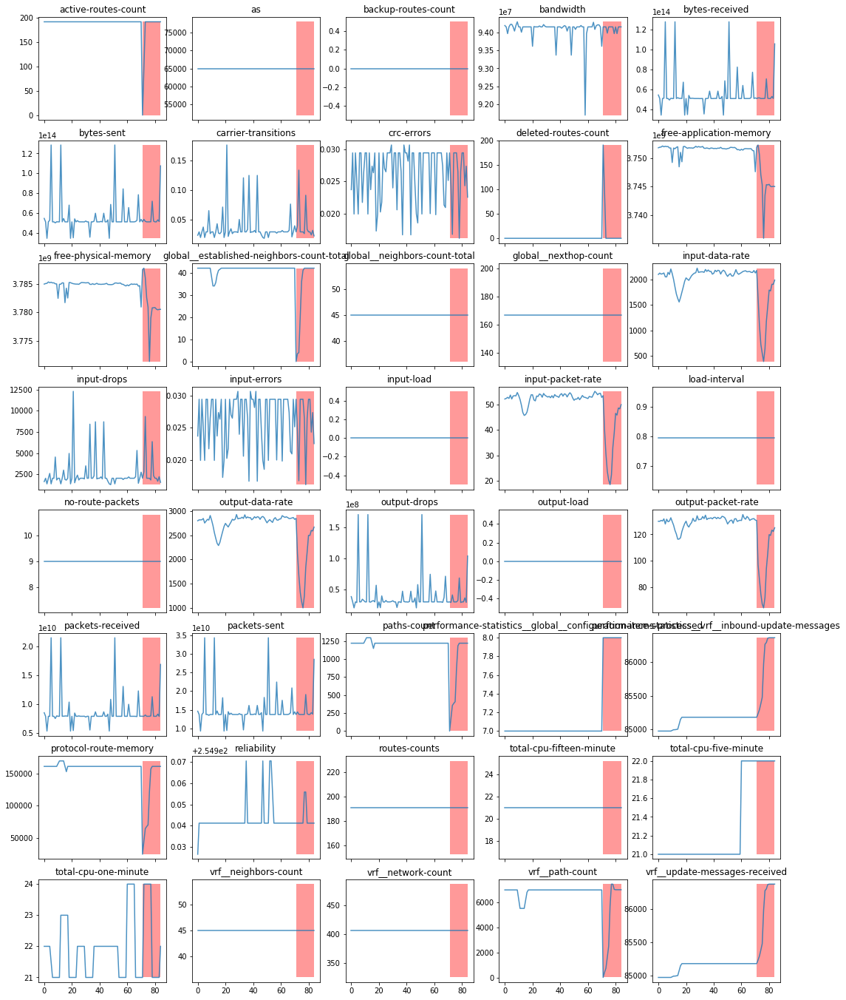

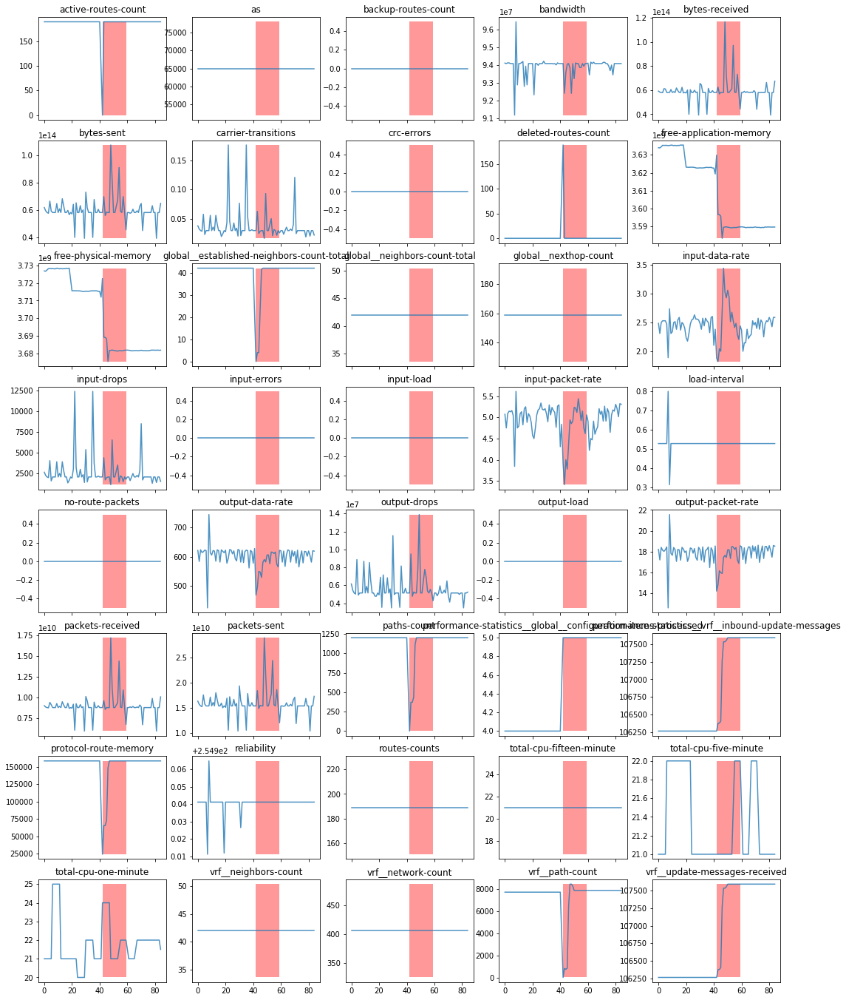

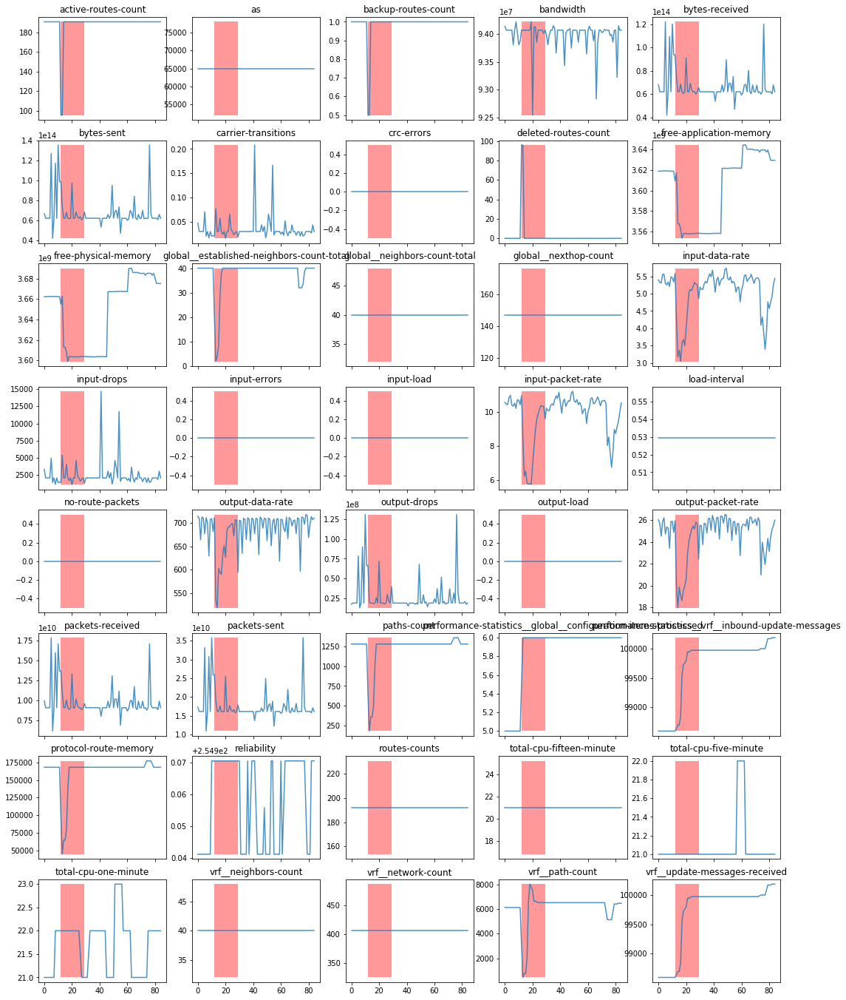

In [211]:
for df in positive_list[40:44]:
    visualize(df[valid_feature_cols].values, df['Anomaly'].values, columns=valid_feature_cols)
    plt.show()

In [232]:
positive_list[20].shape

(85, 51)

In [233]:
import pickle
pickle.dump(d_df_resample_partitioned, open( "../Data/cisco_telemetry/preprocessed_20190401.pkl", "wb"), protocol=-1)